In [1]:
from __future__ import division, print_function, absolute_import

# Import MNIST data
from tensorflow.examples.tutorials.mnist import input_data
mnist = input_data.read_data_sets("data/", one_hot=False)

import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
from keras.datasets import mnist as mn
from keras.preprocessing.image import ImageDataGenerator
from matplotlib import pyplot
from keras import backend as K
K.set_image_dim_ordering('th')

/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


Instructions for updating:
Please use alternatives such as official/mnist/dataset.py from tensorflow/models.
Instructions for updating:
Please write your own downloading logic.
Instructions for updating:
Please use urllib or similar directly.
Successfully downloaded train-images-idx3-ubyte.gz 9912422 bytes.
Instructions for updating:
Please use tf.data to implement this functionality.
Extracting data/train-images-idx3-ubyte.gz
Successfully downloaded train-labels-idx1-ubyte.gz 28881 bytes.
Instructions for updating:
Please use tf.data to implement this functionality.
Extracting data/train-labels-idx1-ubyte.gz
Successfully downloaded t10k-images-idx3-ubyte.gz 1648877 bytes.
Extracting data/t10k-images-idx3-ubyte.gz
Successfully downloaded t10k-labels-idx1-ubyte.gz 4542 bytes.
Extracting data/t10k-labels-idx1-ubyte.gz
Instructions for updating:
Please use alternatives such as official/mnist/dataset.py from tensorflow/models.


Using TensorFlow backend.


In [18]:
# Parameters
mnist = input_data.read_data_sets("data/", one_hot=False)
learning_rate = 0.1
num_steps = 1000
batch_size = 128
display_step = 100
n_images = 20800


# Network Parameters
n_hidden_1 = 256 # 1st layer number of neurons
n_hidden_2 = 256 # 2nd layer number of neurons
num_input = 784 # MNIST data input (img shape: 28*28)
num_classes = 26 # MNIST total classes (0-9 digits)

Extracting data/train-images-idx3-ubyte.gz
Extracting data/train-labels-idx1-ubyte.gz
Extracting data/t10k-images-idx3-ubyte.gz
Extracting data/t10k-labels-idx1-ubyte.gz


In [19]:
# Define the input function for training
input_fn = tf.estimator.inputs.numpy_input_fn(
    x={'images': mnist.train.images}, y=mnist.train.labels,
    batch_size=batch_size, num_epochs=None, shuffle=True)

In [20]:
# Define the neural network
def neural_net(x_dict):
    # TF Estimator input is a dict, in case of multiple inputs
    x = x_dict['images']
    # Hidden fully connected layer with 256 neurons
    layer_1 = tf.layers.dense(x, n_hidden_1)
    # Hidden fully connected layer with 256 neurons
    layer_2 = tf.layers.dense(layer_1, n_hidden_2)
    # Output fully connected layer with a neuron for each class
    out_layer = tf.layers.dense(layer_2, num_classes)
    return out_layer

In [21]:
# Define the model function (following TF Estimator Template)
def model_fn(features, labels, mode):
    
    # Build the neural network
    logits = neural_net(features)
    
    # Predictions
    pred_classes = tf.argmax(logits, axis=1)
    pred_probas = tf.nn.softmax(logits)
    
    # If prediction mode, early return
    if mode == tf.estimator.ModeKeys.PREDICT:
        return tf.estimator.EstimatorSpec(mode, predictions=pred_classes) 
        
    # Define loss and optimizer
    loss_op = tf.reduce_mean(tf.nn.sparse_softmax_cross_entropy_with_logits(
        logits=logits, labels=tf.cast(labels, dtype=tf.int32)))
    optimizer = tf.train.GradientDescentOptimizer(learning_rate=learning_rate)
    train_op = optimizer.minimize(loss_op, global_step=tf.train.get_global_step())
    
    # Evaluate the accuracy of the model
    acc_op = tf.metrics.accuracy(labels=labels, predictions=pred_classes)
    
    # TF Estimators requires to return a EstimatorSpec, that specify
    # the different ops for training, evaluating, ...
    estim_specs = tf.estimator.EstimatorSpec(
      mode=mode,
      predictions=pred_classes,
      loss=loss_op,
      train_op=train_op,
      eval_metric_ops={'accuracy': acc_op})

    return estim_specs

In [22]:
# Build the Estimator
model = tf.estimator.Estimator(model_fn)

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': '/var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': None, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x1c4cc9d9b0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


In [23]:
# Define the input function for training
X_tr={'images': mnist.train.images}
Y_tr=mnist.train.labels
Y_tr = Y_tr - 1
input_fn = tf.estimator.inputs.numpy_input_fn(
    x=X_tr, y=Y_tr,
    batch_size=batch_size, num_epochs=None, shuffle=True)
# Train the Model
model.train(input_fn, steps=num_steps)

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt.
INFO:tensorflow:loss = 3.5491052, step = 1
INFO:tensorflow:global_step/sec: 160.635
INFO:tensorflow:loss = 1.2910771, step = 101 (0.624 sec)
INFO:tensorflow:global_step/sec: 174.159
INFO:tensorflow:loss = 1.0228736, step = 201 (0.574 sec)
INFO:tensorflow:global_step/sec: 169.49
INFO:tensorflow:loss = 1.179794, step = 301 (0.590 sec)
INFO:tensorflow:global_step/sec: 171.353
INFO:tensorflow:loss = 1.241108, step = 401 (0.583 sec)
INFO:tensorflow:global_step/sec: 171.731
INFO:tensorflow:loss = 0.94327193, step = 501 (0.583 sec)
INFO:tensorflow:global_step/sec: 155.774
INFO:tensorflow:loss = 1.2084723, step = 601 (0.642 sec)
INFO:tensorflow

In [24]:
# Evaluate the Model
# Define the input function for evaluating
x_te = mnist.test.images
y_te = mnist.test.labels
y_te = y_te - 1
input_fn = tf.estimator.inputs.numpy_input_fn(
    x={'images': x_te}, y=y_te,
    batch_size=batch_size, shuffle=False)
# Use the Estimator 'evaluate' method
model.evaluate(input_fn)

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-11-01-16:02:57
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-11-01-16:02:58
INFO:tensorflow:Saving dict for global step 1000: accuracy = 0.69259614, global_step = 1000, loss = 1.0810096
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1000: /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000


{'accuracy': 0.69259614, 'loss': 1.0810096, 'global_step': 1000}

In [25]:

# Get images from test set
test_images = mnist.test.images[:n_images]
# Prepare the input data
input_fn = tf.estimator.inputs.numpy_input_fn(
    x={'images': test_images}, shuffle=False)
# Use the model to predict the images class
preds = list(model.predict(input_fn))
# print(test_images[0])
# Display
# for i in range(n_images):
#     plt.imshow(np.reshape(test_images[i], [28, 28]), cmap='gray')
#     plt.show()
#     print("Model prediction:", preds[i])

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


In [27]:
write = 1
if write==1:
    f = open("results/rotate.txt", 'w')

# Predict single images
# Get images from test set
test_images = mnist.test.images[:n_images]
test_label=mnist.test.labels[:n_images]
test_label = test_label - 1
# # reshape to be [samples][pixels][width][height]
y_test = test_label
X_test = test_images.reshape(test_images.shape[0], 1, 28, 28)
# # convert from int to float
X_test = X_test.astype('float32')

X_test_backup = X_test
Y_test_backup = y_test

yBackup = []
pBackup = []



INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


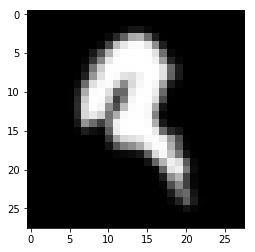

Model prediction: 4
Model accuracy: 0.6925000000000358
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


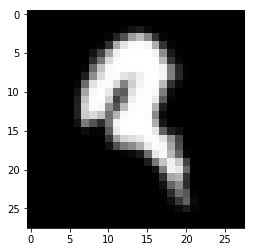

Model prediction: 4
Model accuracy: 0.6894230769231106
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


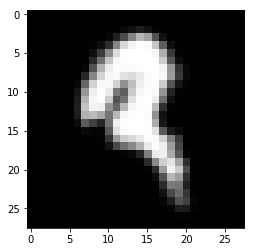

Model prediction: 4
Model accuracy: 0.6863942307692623
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


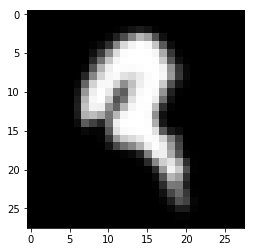

Model prediction: 4
Model accuracy: 0.6849519230769536
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


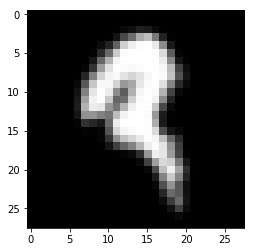

Model prediction: 4
Model accuracy: 0.6775480769231024
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


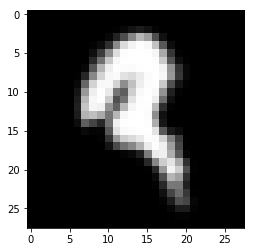

Model prediction: 4
Model accuracy: 0.6721153846154063
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


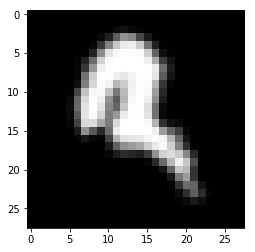

Model prediction: 4
Model accuracy: 0.6666826923077103
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


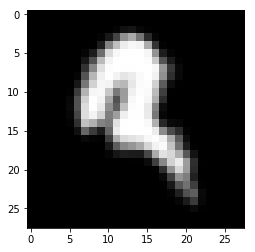

Model prediction: 4
Model accuracy: 0.6567788461538573
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


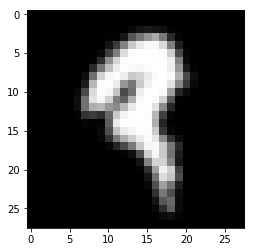

Model prediction: 0
Model accuracy: 0.6427403846153861
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


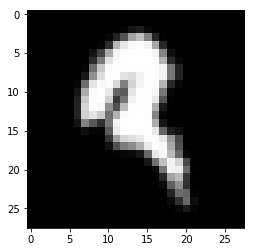

Model prediction: 4
Model accuracy: 0.6317788461538401
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


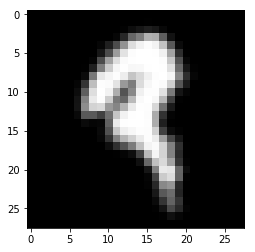

Model prediction: 0
Model accuracy: 0.6216826923076793
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


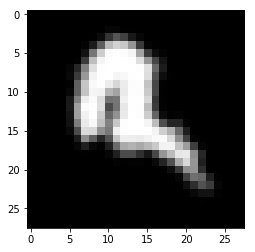

Model prediction: 19
Model accuracy: 0.6094230769230554
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


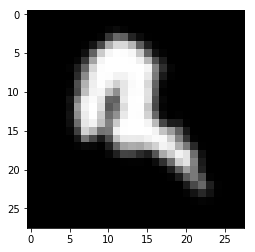

Model prediction: 19
Model accuracy: 0.595576923076892
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


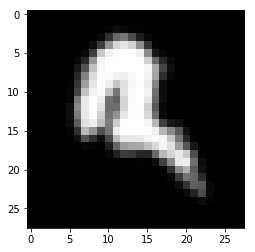

Model prediction: 19
Model accuracy: 0.5787980769230343
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


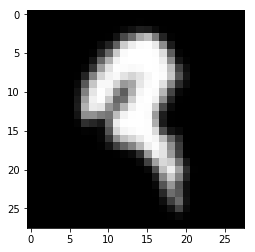

Model prediction: 4
Model accuracy: 0.5701442307691822
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


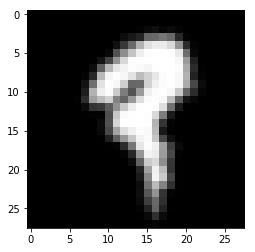

Model prediction: 7
Model accuracy: 0.5519230769230158
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


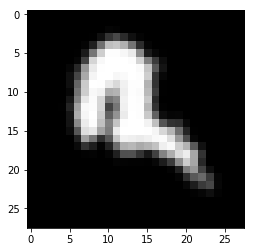

Model prediction: 19
Model accuracy: 0.5437019230768563
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


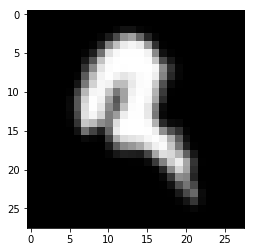

Model prediction: 4
Model accuracy: 0.5288942307691538
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


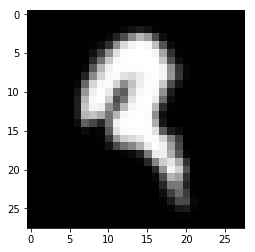

Model prediction: 4
Model accuracy: 0.5058653846152917
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


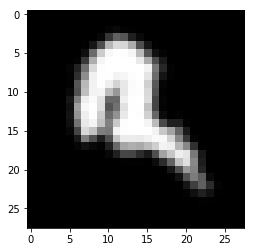

Model prediction: 19
Model accuracy: 0.49524038461528996
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


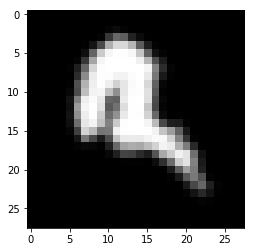

Model prediction: 19
Model accuracy: 0.4766826923076063
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


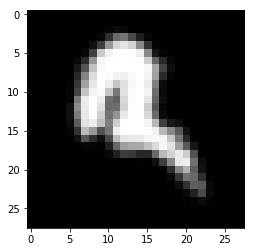

Model prediction: 19
Model accuracy: 0.4712980769229934
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


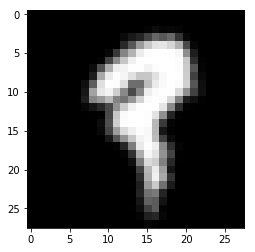

Model prediction: 7
Model accuracy: 0.45221153846146384
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


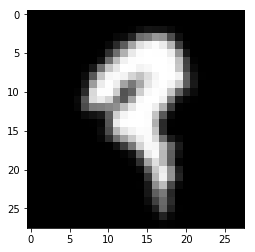

Model prediction: 0
Model accuracy: 0.44649038461531265
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


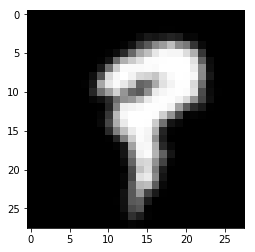

Model prediction: 7
Model accuracy: 0.43144230769224273
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


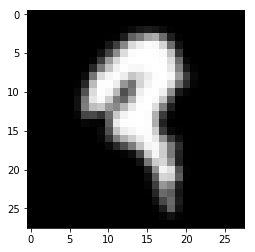

Model prediction: 0
Model accuracy: 0.41908653846147925
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


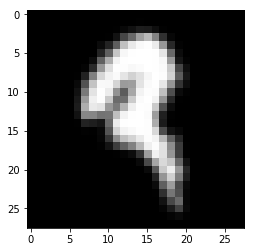

Model prediction: 4
Model accuracy: 0.40572115384610086
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


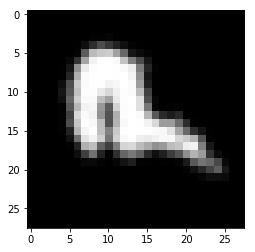

Model prediction: 24
Model accuracy: 0.4013461538461029
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


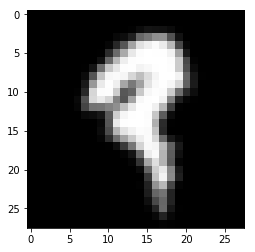

Model prediction: 0
Model accuracy: 0.3876442307691862
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


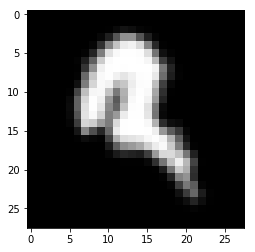

Model prediction: 4
Model accuracy: 0.3823076923076502
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


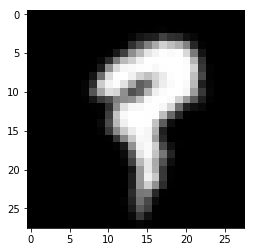

Model prediction: 7
Model accuracy: 0.3751923076922689
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


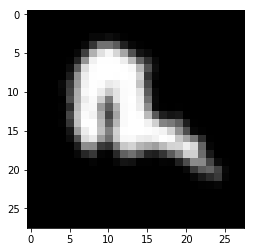

Model prediction: 19
Model accuracy: 0.3624999999999671
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


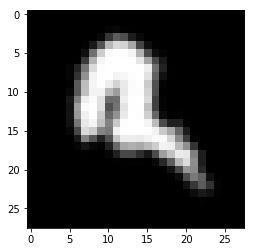

Model prediction: 19
Model accuracy: 0.35600961538458553
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


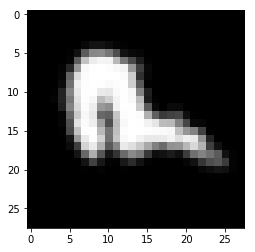

Model prediction: 24
Model accuracy: 0.3519711538461259
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


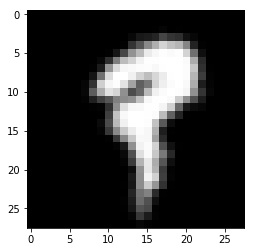

Model prediction: 7
Model accuracy: 0.33581730769228724
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


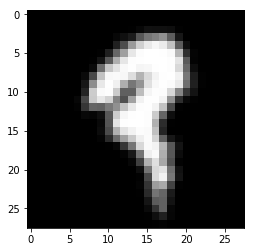

Model prediction: 0
Model accuracy: 0.33677884615382525
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


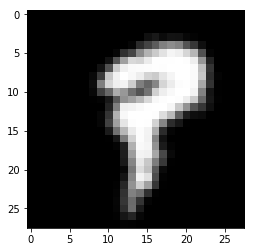

Model prediction: 7
Model accuracy: 0.3195673076922948
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


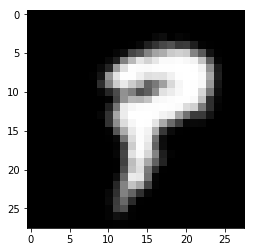

Model prediction: 7
Model accuracy: 0.31067307692306817
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


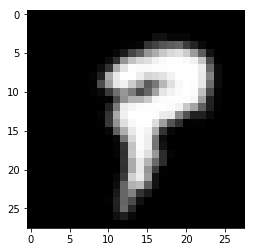

Model prediction: 7
Model accuracy: 0.30389423076922517
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


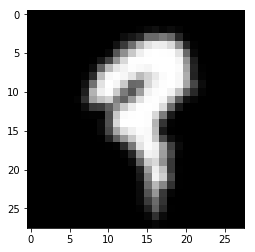

Model prediction: 7
Model accuracy: 0.3008653846153804
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


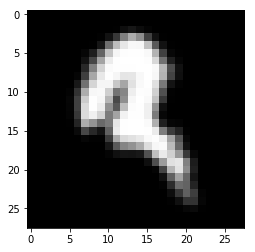

Model prediction: 4
Model accuracy: 0.2994230769230734
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


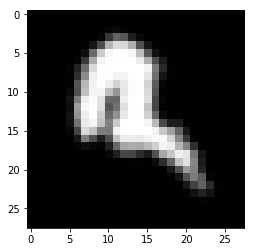

Model prediction: 19
Model accuracy: 0.2933653846153839
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


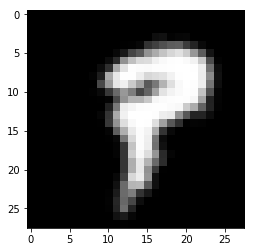

Model prediction: 7
Model accuracy: 0.28278846153846576
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


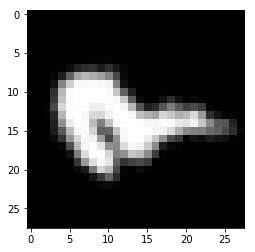

Model prediction: 19
Model accuracy: 0.28288461538461956
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


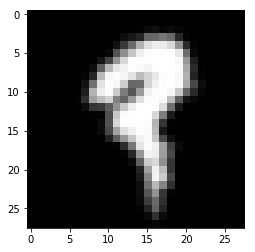

Model prediction: 7
Model accuracy: 0.27427884615385434
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


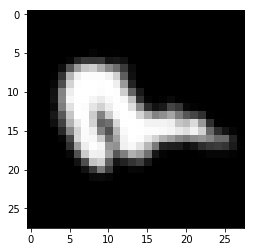

Model prediction: 24
Model accuracy: 0.2703846153846254
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


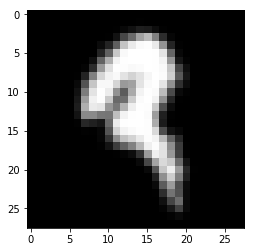

Model prediction: 4
Model accuracy: 0.26274038461539817
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


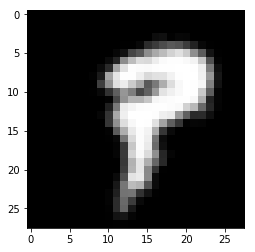

Model prediction: 7
Model accuracy: 0.2583653846154002
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


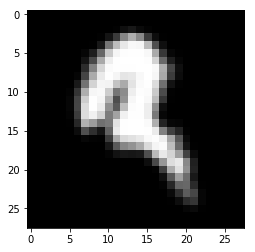

Model prediction: 4
Model accuracy: 0.2521153846154031
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


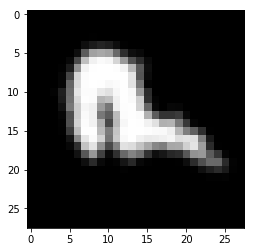

Model prediction: 24
Model accuracy: 0.2525480769230952
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


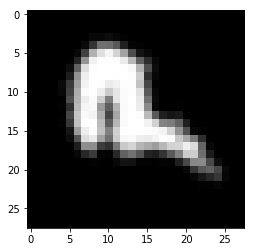

Model prediction: 19
Model accuracy: 0.24875000000001937
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


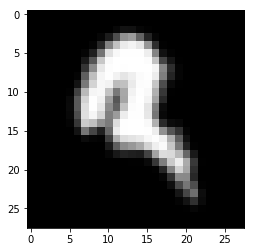

Model prediction: 4
Model accuracy: 0.2408653846154031
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


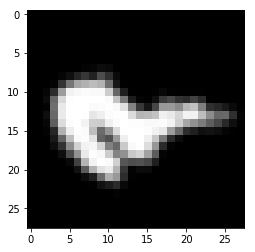

Model prediction: 19
Model accuracy: 0.2440865384615573
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


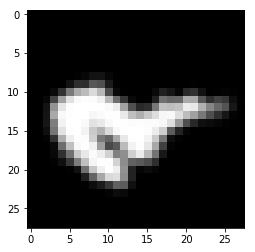

Model prediction: 19
Model accuracy: 0.2364423076923257
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


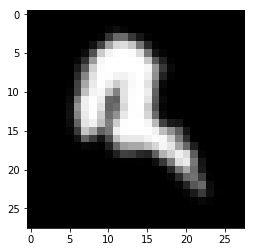

Model prediction: 19
Model accuracy: 0.23250000000001755
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


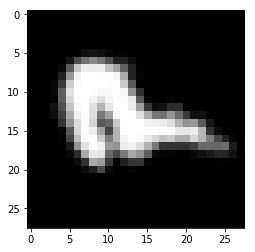

Model prediction: 24
Model accuracy: 0.2303846153846327
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


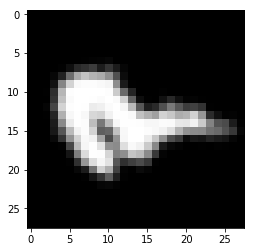

Model prediction: 19
Model accuracy: 0.22451923076924743
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


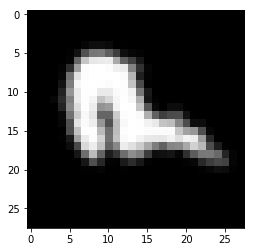

Model prediction: 24
Model accuracy: 0.22230769230770872
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


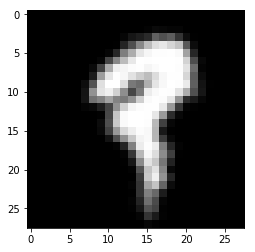

Model prediction: 7
Model accuracy: 0.22197115384617022
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


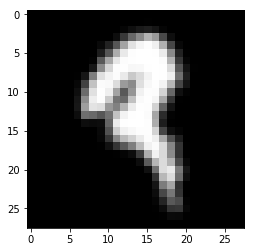

Model prediction: 0
Model accuracy: 0.21538461538463102
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


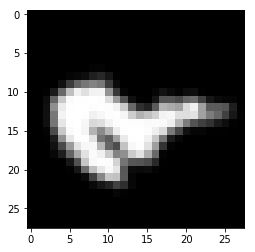

Model prediction: 19
Model accuracy: 0.21375000000001546
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


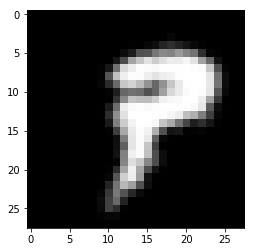

Model prediction: 7
Model accuracy: 0.2090865384615534
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


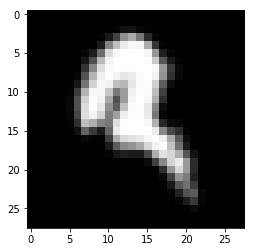

Model prediction: 4
Model accuracy: 0.21173076923078446
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


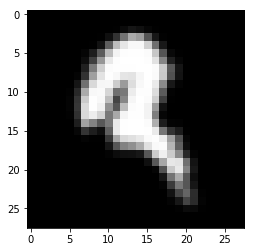

Model prediction: 4
Model accuracy: 0.2035096153846297
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


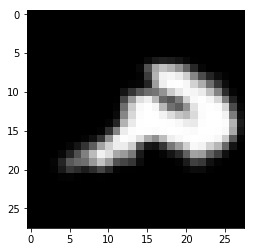

Model prediction: 3
Model accuracy: 0.20682692307693776
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


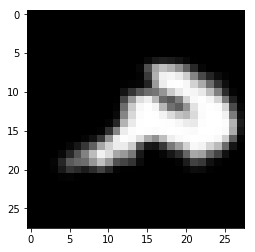

Model prediction: 3
Model accuracy: 0.20264423076924498
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


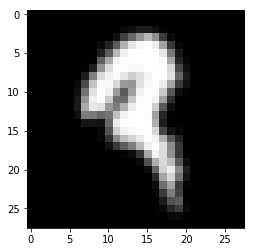

Model prediction: 0
Model accuracy: 0.19466346153847486
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


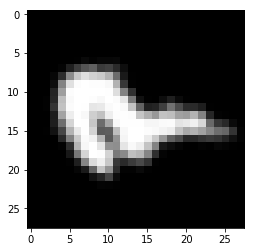

Model prediction: 24
Model accuracy: 0.19966346153847542
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


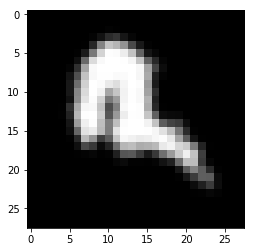

Model prediction: 19
Model accuracy: 0.19548076923078264
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


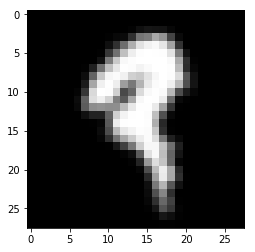

Model prediction: 0
Model accuracy: 0.1883173076923203
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


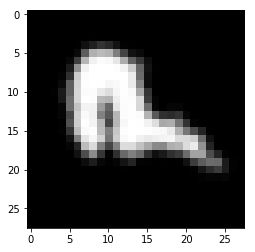

Model prediction: 24
Model accuracy: 0.1900000000000128
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


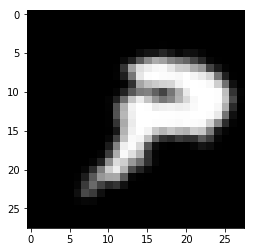

Model prediction: 3
Model accuracy: 0.18850961538462802
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


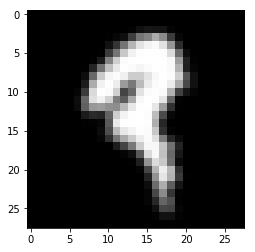

Model prediction: 0
Model accuracy: 0.18552884615385845
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


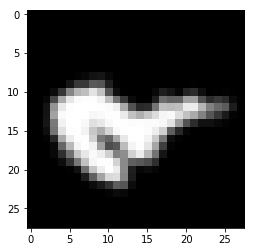

Model prediction: 19
Model accuracy: 0.18024038461539632
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


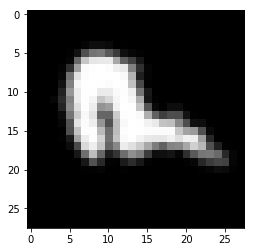

Model prediction: 24
Model accuracy: 0.18024038461539632
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


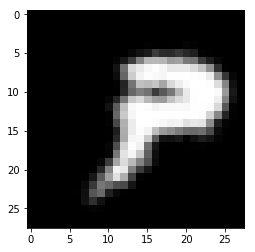

Model prediction: 3
Model accuracy: 0.18399038461539674
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


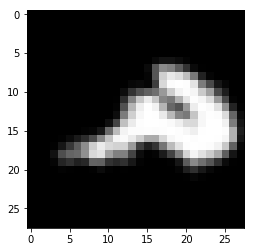

Model prediction: 3
Model accuracy: 0.17355769230770327
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


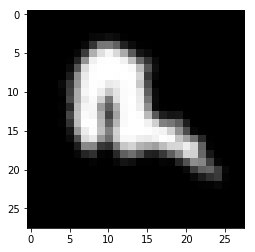

Model prediction: 19
Model accuracy: 0.17557692307693426
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


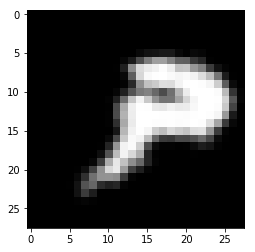

Model prediction: 3
Model accuracy: 0.17509615384616498
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


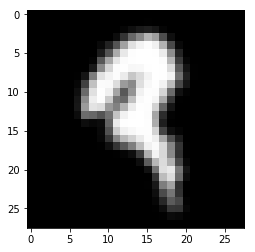

Model prediction: 0
Model accuracy: 0.17533653846154962
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


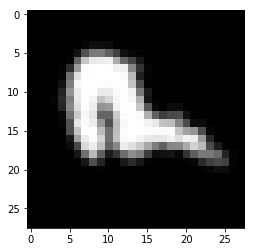

Model prediction: 24
Model accuracy: 0.17264423076924162
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


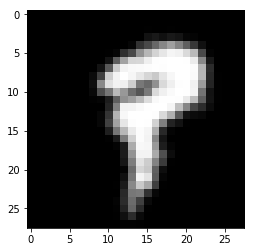

Model prediction: 7
Model accuracy: 0.16283653846154822
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


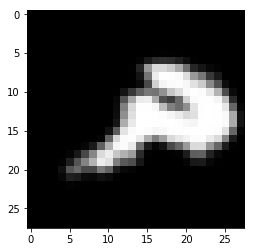

Model prediction: 3
Model accuracy: 0.1639903846153945
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


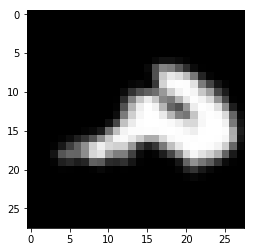

Model prediction: 3
Model accuracy: 0.16572115384616393
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


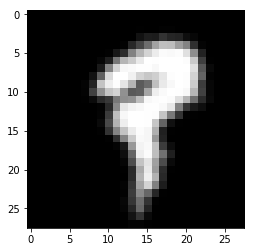

Model prediction: 7
Model accuracy: 0.16591346153847164
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


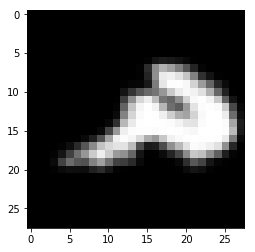

Model prediction: 3
Model accuracy: 0.16524038461539464
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


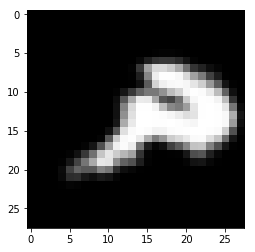

Model prediction: 3
Model accuracy: 0.16240384615385586
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


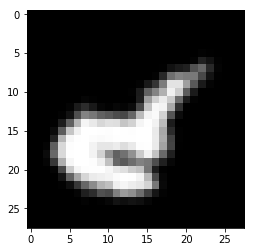

Model prediction: 15
Model accuracy: 0.15879807692308623
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


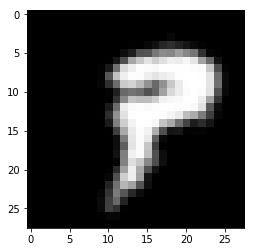

Model prediction: 7
Model accuracy: 0.15870192307693237
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


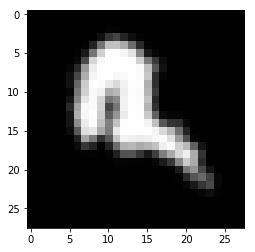

Model prediction: 19
Model accuracy: 0.15379807692308567
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


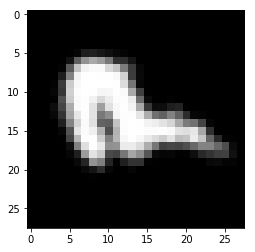

Model prediction: 24
Model accuracy: 0.15802884615385537
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


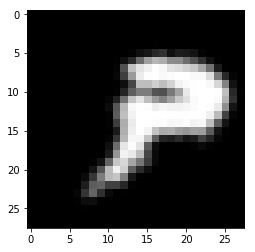

Model prediction: 3
Model accuracy: 0.15365384615385488
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


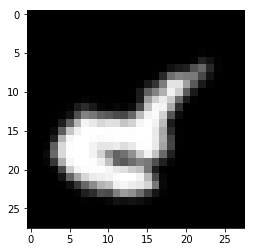

Model prediction: 15
Model accuracy: 0.15413461538462417
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


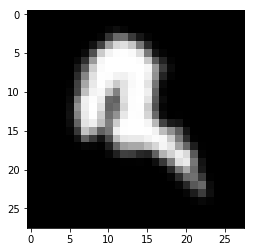

Model prediction: 19
Model accuracy: 0.15000000000000832
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


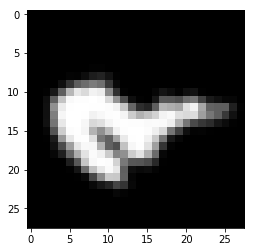

Model prediction: 19
Model accuracy: 0.1508173076923161
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


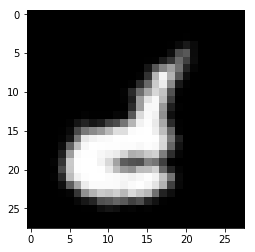

Model prediction: 15
Model accuracy: 0.1516346153846239
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


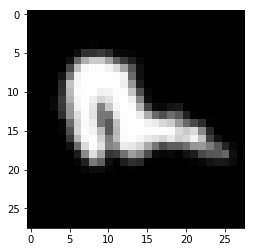

Model prediction: 24
Model accuracy: 0.15033653846154682
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


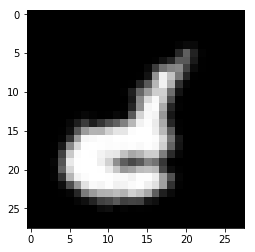

Model prediction: 15
Model accuracy: 0.15125000000000846
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


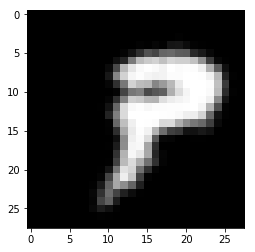

Model prediction: 22
Model accuracy: 0.14644230769231562
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/33/cbwqx9c11lgfbcvwxr2yf6jm0000gn/T/tmp90qstorn/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


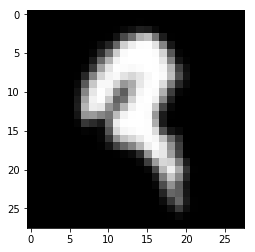

Model prediction: 4
Model accuracy: 0.14865384615385432
Done!


In [28]:
angle = 0.0
accMat = []
for s in range(0,100):
    angle = angle+1
    X_test = X_test_backup
    y_test = Y_test_backup
    angle = angle+0.5
    datagen = ImageDataGenerator(rotation_range=angle)# fit parameters from data
    datagen.fit(X_test)
    tmp = []
    # configure batch size and retrieve one batch of images
    for X_batch, y_batch in datagen.flow(X_test, y_test, batch_size=n_images, shuffle=False):
        tmp = X_batch
        yTemp = y_batch
        break
    y_test = yTemp
    X_test = tmp.reshape(test_images.shape[0],1, 1, 784)
    l = []
    for x in X_test:
        l.append(x[0][0])
    X_test = np.array(l)
    # # convert from int to float
    X_test = X_test.astype('float32')
    x_te={'images': X_test}
    input_fn = tf.estimator.inputs.numpy_input_fn(
        x=x_te, shuffle=False)
    # Use the model to predict the images class
    preds = list(model.predict(input_fn))
    accuracy = 0.0
    # Display
    for i in range(n_images):
        if (preds[i] == y_test[i]):
                accuracy = accuracy + 1/n_images
#         plt.imshow(np.reshape(tmp[i], [28, 28]), cmap='gray')
#         plt.show()
#         print("Model prediction:", preds[i])
    plt.imshow(np.reshape(X_test[0], [28, 28]), cmap='gray')
    plt.show()
    print("Model prediction:", preds[0])
    print("Model accuracy:", accuracy)
    yBackup.append(y_test)
    pBackup.append(preds)
    accMat.append(accuracy)
    if write==1:
        f.write(str(angle)+"\t"+str(accuracy)+"\n")
if write==1:
    f.close()
print("Done!")

In [29]:
yTotal = [0]*num_classes

for y in y_test:
    yTotal[y] = yTotal[y]+1

aMatrix = []
for i in range(len(pBackup)):
    print("\n\nYmatrix for rotation %d"%(i))
    yMatrix = [[0]*num_classes for i in range(num_classes)]
    for j in range(len(pBackup[i])):
        yMatrix[yBackup[i][j]][pBackup[i][j]] += 1

    sum = 0
    
    for x in range(len(yMatrix)):
        for y in range(len(yMatrix[x])):
            yMatrix[x][y] = round(yMatrix[x][y]/yTotal[x], 3)

    aMatrix.append(yMatrix)
    for x in yMatrix:
        for y in x:
            print("%f" % (y),end=" ")
        print()
    



Ymatrix for rotation 0
0.640000 0.006000 0.003000 0.044000 0.014000 0.015000 0.020000 0.049000 0.001000 0.001000 0.009000 0.001000 0.010000 0.062000 0.019000 0.016000 0.022000 0.009000 0.000000 0.001000 0.016000 0.000000 0.005000 0.016000 0.003000 0.018000 
0.014000 0.713000 0.000000 0.087000 0.007000 0.005000 0.033000 0.054000 0.009000 0.006000 0.006000 0.006000 0.003000 0.006000 0.007000 0.004000 0.004000 0.001000 0.001000 0.001000 0.007000 0.000000 0.001000 0.003000 0.001000 0.020000 
0.024000 0.001000 0.781000 0.009000 0.029000 0.003000 0.020000 0.000000 0.006000 0.003000 0.009000 0.001000 0.000000 0.013000 0.031000 0.007000 0.001000 0.022000 0.003000 0.004000 0.022000 0.001000 0.003000 0.001000 0.001000 0.005000 
0.022000 0.043000 0.004000 0.705000 0.000000 0.000000 0.009000 0.033000 0.010000 0.009000 0.010000 0.018000 0.001000 0.009000 0.062000 0.011000 0.009000 0.000000 0.000000 0.000000 0.018000 0.009000 0.003000 0.003000 0.003000 0.013000 
0.044000 0.018000 0.087000 0.001000

0.001000 0.007000 0.028000 0.046000 0.000000 0.007000 0.001000 0.001000 0.292000 0.006000 0.024000 0.479000 0.000000 0.001000 0.000000 0.005000 0.000000 0.005000 0.000000 0.007000 0.035000 0.006000 0.000000 0.024000 0.005000 0.018000 
0.011000 0.000000 0.000000 0.001000 0.001000 0.001000 0.000000 0.009000 0.000000 0.000000 0.004000 0.000000 0.861000 0.074000 0.001000 0.004000 0.005000 0.004000 0.000000 0.003000 0.003000 0.001000 0.007000 0.003000 0.006000 0.001000 
0.051000 0.001000 0.000000 0.019000 0.000000 0.000000 0.003000 0.059000 0.000000 0.000000 0.030000 0.001000 0.051000 0.661000 0.003000 0.006000 0.004000 0.011000 0.000000 0.001000 0.019000 0.021000 0.044000 0.010000 0.004000 0.001000 
0.028000 0.005000 0.005000 0.037000 0.000000 0.003000 0.022000 0.001000 0.000000 0.000000 0.000000 0.000000 0.004000 0.026000 0.848000 0.001000 0.006000 0.007000 0.000000 0.000000 0.006000 0.000000 0.000000 0.000000 0.000000 0.000000 
0.004000 0.000000 0.001000 0.004000 0.003000 0.022000 0.0050

0.000000 0.009000 0.003000 0.006000 0.003000 0.006000 0.021000 0.013000 0.028000 0.031000 0.004000 0.039000 0.004000 0.005000 0.000000 0.006000 0.001000 0.022000 0.003000 0.068000 0.006000 0.054000 0.001000 0.059000 0.606000 0.004000 
0.013000 0.018000 0.005000 0.036000 0.007000 0.003000 0.011000 0.003000 0.011000 0.028000 0.009000 0.014000 0.004000 0.016000 0.000000 0.000000 0.006000 0.010000 0.007000 0.005000 0.006000 0.001000 0.000000 0.035000 0.003000 0.750000 


Ymatrix for rotation 5
0.613000 0.004000 0.006000 0.050000 0.013000 0.018000 0.030000 0.046000 0.001000 0.001000 0.009000 0.001000 0.013000 0.061000 0.022000 0.015000 0.022000 0.013000 0.001000 0.003000 0.024000 0.000000 0.006000 0.011000 0.001000 0.016000 
0.016000 0.694000 0.000000 0.094000 0.009000 0.005000 0.034000 0.056000 0.009000 0.004000 0.006000 0.007000 0.003000 0.010000 0.010000 0.003000 0.006000 0.001000 0.001000 0.001000 0.005000 0.000000 0.001000 0.006000 0.001000 0.018000 
0.025000 0.003000 0.780000 0.010000

0.001000 0.006000 0.005000 0.151000 0.001000 0.006000 0.021000 0.003000 0.018000 0.665000 0.000000 0.029000 0.000000 0.000000 0.000000 0.003000 0.004000 0.006000 0.024000 0.013000 0.011000 0.001000 0.000000 0.009000 0.013000 0.011000 
0.026000 0.019000 0.025000 0.010000 0.014000 0.007000 0.003000 0.081000 0.020000 0.000000 0.551000 0.011000 0.010000 0.013000 0.000000 0.000000 0.007000 0.079000 0.000000 0.005000 0.009000 0.014000 0.006000 0.072000 0.004000 0.014000 
0.000000 0.010000 0.037000 0.052000 0.000000 0.005000 0.000000 0.003000 0.285000 0.011000 0.028000 0.448000 0.000000 0.000000 0.000000 0.004000 0.000000 0.005000 0.000000 0.010000 0.035000 0.009000 0.001000 0.030000 0.011000 0.016000 
0.015000 0.000000 0.000000 0.001000 0.003000 0.001000 0.001000 0.013000 0.000000 0.000000 0.003000 0.000000 0.853000 0.072000 0.000000 0.006000 0.005000 0.004000 0.000000 0.003000 0.005000 0.001000 0.007000 0.003000 0.004000 0.001000 
0.049000 0.004000 0.000000 0.018000 0.000000 0.000000 0.0010

0.052000 0.006000 0.000000 0.018000 0.001000 0.000000 0.005000 0.079000 0.000000 0.003000 0.024000 0.000000 0.060000 0.579000 0.021000 0.010000 0.021000 0.016000 0.000000 0.001000 0.021000 0.016000 0.048000 0.011000 0.005000 0.003000 
0.028000 0.006000 0.006000 0.033000 0.001000 0.001000 0.026000 0.000000 0.000000 0.000000 0.000000 0.000000 0.006000 0.041000 0.834000 0.003000 0.005000 0.003000 0.000000 0.000000 0.006000 0.000000 0.001000 0.000000 0.000000 0.000000 
0.003000 0.001000 0.001000 0.004000 0.004000 0.035000 0.006000 0.003000 0.003000 0.000000 0.001000 0.000000 0.003000 0.006000 0.005000 0.765000 0.010000 0.068000 0.000000 0.059000 0.000000 0.003000 0.000000 0.004000 0.018000 0.001000 
0.092000 0.009000 0.006000 0.030000 0.005000 0.028000 0.152000 0.004000 0.009000 0.013000 0.007000 0.004000 0.000000 0.005000 0.015000 0.034000 0.470000 0.005000 0.011000 0.033000 0.021000 0.000000 0.001000 0.019000 0.018000 0.010000 
0.052000 0.006000 0.028000 0.000000 0.011000 0.018000 0.0030

0.034000 0.026000 0.011000 0.006000 0.004000 0.000000 0.083000 0.001000 0.010000 0.083000 0.004000 0.005000 0.006000 0.003000 0.009000 0.003000 0.020000 0.007000 0.652000 0.004000 0.007000 0.000000 0.004000 0.004000 0.005000 0.010000 
0.010000 0.029000 0.014000 0.003000 0.026000 0.074000 0.020000 0.040000 0.024000 0.016000 0.024000 0.010000 0.003000 0.001000 0.003000 0.036000 0.039000 0.084000 0.005000 0.404000 0.001000 0.004000 0.001000 0.018000 0.111000 0.003000 
0.070000 0.007000 0.004000 0.066000 0.000000 0.001000 0.010000 0.022000 0.000000 0.003000 0.011000 0.010000 0.001000 0.015000 0.019000 0.000000 0.005000 0.001000 0.000000 0.000000 0.704000 0.016000 0.029000 0.001000 0.000000 0.004000 
0.003000 0.001000 0.021000 0.020000 0.005000 0.000000 0.001000 0.015000 0.004000 0.000000 0.010000 0.026000 0.006000 0.030000 0.001000 0.010000 0.020000 0.085000 0.000000 0.006000 0.117000 0.542000 0.024000 0.029000 0.021000 0.001000 
0.034000 0.010000 0.000000 0.041000 0.001000 0.000000 0.0040

0.021000 0.080000 0.007000 0.625000 0.003000 0.003000 0.020000 0.029000 0.009000 0.010000 0.004000 0.018000 0.003000 0.004000 0.066000 0.006000 0.007000 0.000000 0.005000 0.000000 0.031000 0.006000 0.021000 0.004000 0.005000 0.014000 
0.044000 0.043000 0.081000 0.007000 0.608000 0.009000 0.011000 0.005000 0.000000 0.003000 0.022000 0.003000 0.005000 0.011000 0.020000 0.014000 0.020000 0.055000 0.009000 0.013000 0.004000 0.000000 0.001000 0.004000 0.000000 0.010000 
0.005000 0.001000 0.005000 0.003000 0.003000 0.630000 0.020000 0.010000 0.015000 0.009000 0.013000 0.006000 0.004000 0.001000 0.000000 0.072000 0.035000 0.062000 0.009000 0.048000 0.000000 0.006000 0.006000 0.010000 0.019000 0.009000 
0.087000 0.040000 0.028000 0.031000 0.010000 0.011000 0.426000 0.004000 0.004000 0.041000 0.001000 0.003000 0.006000 0.011000 0.006000 0.025000 0.129000 0.005000 0.040000 0.025000 0.022000 0.000000 0.007000 0.005000 0.022000 0.009000 
0.044000 0.055000 0.004000 0.029000 0.003000 0.009000 0.0200

0.000000 0.001000 0.001000 0.005000 0.003000 0.041000 0.007000 0.003000 0.001000 0.000000 0.000000 0.000000 0.004000 0.007000 0.003000 0.729000 0.007000 0.087000 0.000000 0.070000 0.001000 0.001000 0.003000 0.005000 0.018000 0.003000 
0.079000 0.014000 0.011000 0.034000 0.001000 0.033000 0.145000 0.009000 0.014000 0.015000 0.006000 0.001000 0.001000 0.014000 0.013000 0.061000 0.415000 0.006000 0.014000 0.041000 0.026000 0.001000 0.004000 0.016000 0.016000 0.010000 
0.045000 0.009000 0.041000 0.003000 0.019000 0.035000 0.009000 0.013000 0.004000 0.000000 0.020000 0.000000 0.031000 0.016000 0.000000 0.024000 0.052000 0.583000 0.000000 0.045000 0.004000 0.006000 0.007000 0.018000 0.007000 0.010000 
0.048000 0.040000 0.005000 0.010000 0.005000 0.000000 0.101000 0.003000 0.009000 0.085000 0.004000 0.005000 0.003000 0.003000 0.005000 0.000000 0.033000 0.013000 0.600000 0.001000 0.014000 0.000000 0.003000 0.003000 0.004000 0.007000 
0.005000 0.033000 0.011000 0.001000 0.022000 0.075000 0.0150

0.028000 0.627000 0.001000 0.111000 0.019000 0.004000 0.048000 0.039000 0.013000 0.010000 0.009000 0.013000 0.005000 0.004000 0.013000 0.004000 0.016000 0.001000 0.009000 0.004000 0.007000 0.000000 0.001000 0.004000 0.001000 0.011000 
0.015000 0.035000 0.713000 0.011000 0.035000 0.003000 0.019000 0.000000 0.004000 0.005000 0.014000 0.001000 0.004000 0.005000 0.044000 0.010000 0.001000 0.026000 0.004000 0.006000 0.040000 0.000000 0.003000 0.001000 0.000000 0.003000 
0.022000 0.084000 0.005000 0.570000 0.001000 0.001000 0.028000 0.030000 0.009000 0.011000 0.003000 0.018000 0.004000 0.011000 0.086000 0.011000 0.013000 0.000000 0.001000 0.001000 0.036000 0.001000 0.036000 0.006000 0.001000 0.010000 
0.048000 0.054000 0.080000 0.016000 0.578000 0.009000 0.015000 0.005000 0.000000 0.001000 0.022000 0.001000 0.006000 0.019000 0.021000 0.011000 0.014000 0.056000 0.010000 0.010000 0.003000 0.000000 0.006000 0.004000 0.000000 0.011000 
0.005000 0.006000 0.005000 0.001000 0.010000 0.626000 0.0280

0.007000 0.004000 0.004000 0.016000 0.000000 0.010000 0.036000 0.014000 0.022000 0.030000 0.003000 0.034000 0.009000 0.003000 0.001000 0.107000 0.046000 0.024000 0.005000 0.185000 0.004000 0.040000 0.001000 0.045000 0.344000 0.006000 
0.033000 0.062000 0.030000 0.049000 0.050000 0.003000 0.048000 0.011000 0.006000 0.036000 0.037000 0.011000 0.001000 0.007000 0.001000 0.009000 0.031000 0.018000 0.024000 0.007000 0.004000 0.001000 0.009000 0.028000 0.003000 0.481000 


Ymatrix for rotation 19
0.406000 0.036000 0.005000 0.050000 0.007000 0.011000 0.092000 0.043000 0.000000 0.000000 0.015000 0.005000 0.041000 0.048000 0.026000 0.022000 0.098000 0.007000 0.000000 0.022000 0.026000 0.000000 0.009000 0.011000 0.005000 0.013000 
0.035000 0.559000 0.004000 0.149000 0.014000 0.005000 0.070000 0.041000 0.011000 0.006000 0.007000 0.010000 0.005000 0.007000 0.014000 0.003000 0.015000 0.001000 0.004000 0.000000 0.009000 0.000000 0.001000 0.006000 0.003000 0.021000 
0.011000 0.033000 0.675000 0.01500

0.015000 0.046000 0.675000 0.019000 0.025000 0.001000 0.021000 0.001000 0.003000 0.003000 0.014000 0.004000 0.003000 0.009000 0.062000 0.010000 0.003000 0.030000 0.001000 0.010000 0.041000 0.000000 0.003000 0.000000 0.000000 0.003000 
0.020000 0.099000 0.007000 0.529000 0.005000 0.001000 0.036000 0.020000 0.004000 0.019000 0.004000 0.016000 0.005000 0.007000 0.084000 0.007000 0.013000 0.001000 0.001000 0.000000 0.045000 0.005000 0.052000 0.006000 0.003000 0.010000 
0.040000 0.076000 0.085000 0.015000 0.505000 0.005000 0.021000 0.009000 0.000000 0.001000 0.013000 0.006000 0.010000 0.020000 0.037000 0.014000 0.025000 0.070000 0.007000 0.015000 0.001000 0.000000 0.007000 0.003000 0.000000 0.014000 
0.001000 0.006000 0.004000 0.004000 0.007000 0.526000 0.018000 0.021000 0.020000 0.011000 0.013000 0.005000 0.006000 0.001000 0.001000 0.107000 0.045000 0.072000 0.009000 0.050000 0.004000 0.006000 0.010000 0.015000 0.031000 0.005000 
0.074000 0.060000 0.026000 0.041000 0.006000 0.013000 0.3800

0.026000 0.011000 0.010000 0.049000 0.001000 0.001000 0.043000 0.000000 0.000000 0.000000 0.000000 0.000000 0.016000 0.044000 0.767000 0.000000 0.009000 0.005000 0.000000 0.000000 0.014000 0.000000 0.001000 0.001000 0.001000 0.000000 
0.004000 0.000000 0.005000 0.001000 0.006000 0.058000 0.014000 0.000000 0.001000 0.000000 0.004000 0.000000 0.037000 0.006000 0.011000 0.596000 0.030000 0.076000 0.000000 0.120000 0.001000 0.001000 0.000000 0.003000 0.013000 0.013000 
0.109000 0.014000 0.005000 0.030000 0.005000 0.025000 0.158000 0.009000 0.011000 0.021000 0.007000 0.006000 0.003000 0.006000 0.015000 0.064000 0.365000 0.011000 0.009000 0.043000 0.018000 0.003000 0.007000 0.020000 0.022000 0.015000 
0.052000 0.014000 0.090000 0.003000 0.030000 0.035000 0.016000 0.007000 0.007000 0.000000 0.029000 0.004000 0.041000 0.010000 0.009000 0.054000 0.061000 0.431000 0.001000 0.045000 0.003000 0.005000 0.007000 0.018000 0.009000 0.019000 
0.052000 0.054000 0.021000 0.021000 0.006000 0.003000 0.1040

0.314000 0.039000 0.007000 0.049000 0.019000 0.007000 0.096000 0.045000 0.000000 0.000000 0.011000 0.003000 0.033000 0.041000 0.048000 0.035000 0.117000 0.006000 0.001000 0.026000 0.026000 0.000000 0.048000 0.014000 0.005000 0.010000 
0.046000 0.520000 0.005000 0.125000 0.025000 0.010000 0.068000 0.044000 0.010000 0.005000 0.006000 0.015000 0.003000 0.006000 0.028000 0.007000 0.021000 0.003000 0.006000 0.003000 0.007000 0.000000 0.006000 0.009000 0.003000 0.020000 
0.015000 0.071000 0.620000 0.019000 0.025000 0.003000 0.019000 0.001000 0.004000 0.005000 0.013000 0.005000 0.005000 0.006000 0.077000 0.010000 0.006000 0.030000 0.006000 0.006000 0.049000 0.001000 0.001000 0.001000 0.000000 0.001000 
0.018000 0.122000 0.007000 0.490000 0.010000 0.001000 0.055000 0.016000 0.003000 0.015000 0.000000 0.016000 0.004000 0.007000 0.086000 0.005000 0.016000 0.000000 0.006000 0.001000 0.025000 0.006000 0.074000 0.005000 0.004000 0.006000 
0.059000 0.083000 0.083000 0.016000 0.465000 0.009000 0.0160

0.000000 0.040000 0.084000 0.034000 0.005000 0.006000 0.003000 0.001000 0.236000 0.005000 0.018000 0.341000 0.001000 0.000000 0.000000 0.054000 0.001000 0.014000 0.001000 0.005000 0.022000 0.006000 0.015000 0.086000 0.010000 0.011000 
0.033000 0.001000 0.001000 0.009000 0.004000 0.001000 0.056000 0.011000 0.000000 0.000000 0.009000 0.010000 0.562000 0.037000 0.009000 0.033000 0.079000 0.044000 0.001000 0.007000 0.013000 0.006000 0.044000 0.005000 0.024000 0.001000 
0.051000 0.010000 0.000000 0.031000 0.011000 0.003000 0.040000 0.066000 0.000000 0.000000 0.014000 0.001000 0.062000 0.354000 0.119000 0.016000 0.106000 0.015000 0.000000 0.007000 0.014000 0.018000 0.043000 0.011000 0.006000 0.001000 
0.028000 0.016000 0.019000 0.060000 0.004000 0.000000 0.036000 0.000000 0.000000 0.000000 0.001000 0.000000 0.011000 0.045000 0.748000 0.001000 0.016000 0.004000 0.000000 0.000000 0.007000 0.000000 0.003000 0.001000 0.000000 0.000000 
0.001000 0.004000 0.007000 0.004000 0.013000 0.075000 0.0220

0.048000 0.149000 0.009000 0.064000 0.015000 0.041000 0.040000 0.311000 0.026000 0.004000 0.055000 0.031000 0.019000 0.034000 0.013000 0.005000 0.050000 0.004000 0.014000 0.003000 0.016000 0.003000 0.009000 0.026000 0.007000 0.006000 
0.000000 0.006000 0.001000 0.001000 0.000000 0.006000 0.011000 0.014000 0.395000 0.049000 0.001000 0.179000 0.000000 0.000000 0.001000 0.069000 0.018000 0.013000 0.019000 0.007000 0.003000 0.018000 0.004000 0.163000 0.006000 0.018000 
0.007000 0.018000 0.005000 0.140000 0.001000 0.021000 0.105000 0.018000 0.010000 0.370000 0.000000 0.039000 0.000000 0.000000 0.009000 0.048000 0.025000 0.020000 0.043000 0.015000 0.044000 0.004000 0.019000 0.006000 0.025000 0.010000 
0.034000 0.110000 0.041000 0.025000 0.035000 0.033000 0.033000 0.054000 0.010000 0.000000 0.239000 0.024000 0.007000 0.004000 0.004000 0.004000 0.087000 0.086000 0.000000 0.034000 0.014000 0.014000 0.018000 0.055000 0.009000 0.029000 
0.000000 0.051000 0.069000 0.035000 0.007000 0.009000 0.0040

0.034000 0.019000 0.001000 0.051000 0.006000 0.009000 0.060000 0.056000 0.000000 0.000000 0.011000 0.001000 0.055000 0.278000 0.142000 0.019000 0.125000 0.010000 0.004000 0.001000 0.022000 0.015000 0.052000 0.014000 0.011000 0.003000 
0.013000 0.022000 0.019000 0.043000 0.003000 0.000000 0.034000 0.004000 0.000000 0.000000 0.000000 0.000000 0.016000 0.049000 0.756000 0.005000 0.018000 0.003000 0.000000 0.001000 0.014000 0.000000 0.003000 0.000000 0.000000 0.000000 
0.004000 0.001000 0.007000 0.004000 0.009000 0.070000 0.021000 0.001000 0.000000 0.001000 0.007000 0.001000 0.044000 0.004000 0.010000 0.515000 0.059000 0.061000 0.000000 0.149000 0.000000 0.004000 0.001000 0.006000 0.007000 0.013000 
0.100000 0.028000 0.010000 0.035000 0.007000 0.022000 0.152000 0.011000 0.006000 0.019000 0.014000 0.005000 0.004000 0.011000 0.022000 0.074000 0.330000 0.010000 0.005000 0.039000 0.021000 0.000000 0.006000 0.025000 0.033000 0.010000 
0.040000 0.021000 0.128000 0.003000 0.030000 0.034000 0.0340

0.072000 0.074000 0.041000 0.025000 0.006000 0.003000 0.105000 0.029000 0.010000 0.071000 0.004000 0.003000 0.009000 0.018000 0.035000 0.006000 0.051000 0.014000 0.338000 0.004000 0.050000 0.001000 0.016000 0.004000 0.004000 0.009000 
0.022000 0.030000 0.019000 0.004000 0.030000 0.043000 0.019000 0.041000 0.015000 0.004000 0.049000 0.025000 0.015000 0.001000 0.020000 0.101000 0.075000 0.061000 0.009000 0.216000 0.000000 0.011000 0.003000 0.081000 0.104000 0.003000 
0.074000 0.026000 0.034000 0.154000 0.005000 0.000000 0.080000 0.019000 0.000000 0.006000 0.010000 0.004000 0.001000 0.011000 0.060000 0.000000 0.068000 0.001000 0.005000 0.005000 0.405000 0.009000 0.019000 0.001000 0.003000 0.001000 
0.049000 0.014000 0.107000 0.045000 0.011000 0.041000 0.029000 0.013000 0.004000 0.016000 0.011000 0.040000 0.007000 0.015000 0.006000 0.077000 0.076000 0.068000 0.000000 0.016000 0.076000 0.233000 0.021000 0.010000 0.013000 0.001000 
0.061000 0.041000 0.011000 0.179000 0.036000 0.001000 0.0220

0.056000 0.034000 0.007000 0.182000 0.040000 0.005000 0.025000 0.035000 0.000000 0.024000 0.006000 0.004000 0.007000 0.018000 0.006000 0.003000 0.060000 0.003000 0.001000 0.001000 0.048000 0.005000 0.372000 0.035000 0.001000 0.021000 
0.084000 0.028000 0.010000 0.016000 0.024000 0.028000 0.128000 0.037000 0.006000 0.003000 0.045000 0.007000 0.007000 0.003000 0.000000 0.019000 0.159000 0.037000 0.045000 0.037000 0.006000 0.011000 0.015000 0.212000 0.018000 0.015000 
0.056000 0.005000 0.005000 0.009000 0.001000 0.046000 0.041000 0.020000 0.007000 0.025000 0.030000 0.020000 0.011000 0.003000 0.009000 0.168000 0.076000 0.026000 0.007000 0.185000 0.005000 0.026000 0.000000 0.022000 0.191000 0.004000 
0.021000 0.066000 0.041000 0.044000 0.101000 0.003000 0.107000 0.016000 0.004000 0.019000 0.029000 0.009000 0.004000 0.006000 0.011000 0.026000 0.092000 0.022000 0.019000 0.007000 0.013000 0.001000 0.033000 0.018000 0.003000 0.285000 


Ymatrix for rotation 35
0.237000 0.054000 0.006000 0.05600

0.050000 0.398000 0.013000 0.110000 0.048000 0.009000 0.104000 0.072000 0.009000 0.004000 0.011000 0.015000 0.010000 0.013000 0.030000 0.000000 0.033000 0.000000 0.004000 0.007000 0.010000 0.000000 0.025000 0.006000 0.004000 0.018000 
0.005000 0.096000 0.475000 0.058000 0.015000 0.000000 0.019000 0.003000 0.003000 0.007000 0.011000 0.005000 0.006000 0.009000 0.135000 0.021000 0.001000 0.037000 0.003000 0.024000 0.062000 0.000000 0.003000 0.000000 0.001000 0.001000 
0.013000 0.126000 0.024000 0.346000 0.011000 0.001000 0.083000 0.020000 0.005000 0.015000 0.004000 0.016000 0.004000 0.011000 0.096000 0.006000 0.029000 0.000000 0.015000 0.005000 0.030000 0.003000 0.121000 0.004000 0.004000 0.009000 
0.031000 0.133000 0.069000 0.033000 0.347000 0.007000 0.021000 0.010000 0.000000 0.003000 0.006000 0.003000 0.036000 0.024000 0.098000 0.016000 0.044000 0.036000 0.006000 0.041000 0.005000 0.000000 0.010000 0.003000 0.004000 0.015000 
0.003000 0.013000 0.016000 0.005000 0.007000 0.296000 0.0440

0.056000 0.007000 0.016000 0.015000 0.000000 0.051000 0.046000 0.016000 0.015000 0.022000 0.060000 0.019000 0.016000 0.006000 0.011000 0.128000 0.062000 0.019000 0.007000 0.176000 0.004000 0.011000 0.005000 0.037000 0.188000 0.004000 
0.024000 0.071000 0.037000 0.043000 0.095000 0.007000 0.110000 0.010000 0.005000 0.013000 0.018000 0.011000 0.006000 0.015000 0.010000 0.051000 0.105000 0.025000 0.014000 0.028000 0.016000 0.001000 0.048000 0.007000 0.005000 0.225000 


Ymatrix for rotation 40
0.221000 0.076000 0.004000 0.051000 0.006000 0.013000 0.121000 0.045000 0.000000 0.000000 0.011000 0.004000 0.043000 0.033000 0.056000 0.025000 0.130000 0.009000 0.000000 0.029000 0.039000 0.000000 0.034000 0.013000 0.033000 0.006000 
0.033000 0.391000 0.011000 0.116000 0.058000 0.009000 0.071000 0.061000 0.004000 0.006000 0.014000 0.019000 0.013000 0.007000 0.035000 0.003000 0.064000 0.001000 0.006000 0.006000 0.016000 0.000000 0.034000 0.009000 0.001000 0.013000 
0.009000 0.081000 0.456000 0.06100

0.081000 0.014000 0.107000 0.064000 0.005000 0.060000 0.048000 0.010000 0.001000 0.060000 0.010000 0.033000 0.025000 0.021000 0.013000 0.056000 0.050000 0.061000 0.007000 0.019000 0.051000 0.166000 0.013000 0.011000 0.007000 0.006000 
0.041000 0.051000 0.005000 0.240000 0.026000 0.001000 0.026000 0.035000 0.004000 0.020000 0.020000 0.004000 0.014000 0.020000 0.005000 0.001000 0.061000 0.001000 0.005000 0.010000 0.033000 0.003000 0.305000 0.039000 0.007000 0.022000 
0.084000 0.037000 0.006000 0.024000 0.014000 0.031000 0.124000 0.070000 0.011000 0.000000 0.052000 0.010000 0.026000 0.003000 0.001000 0.021000 0.121000 0.026000 0.035000 0.054000 0.000000 0.007000 0.019000 0.186000 0.022000 0.014000 
0.068000 0.006000 0.019000 0.015000 0.000000 0.039000 0.046000 0.021000 0.011000 0.022000 0.040000 0.021000 0.028000 0.003000 0.015000 0.150000 0.052000 0.018000 0.005000 0.179000 0.007000 0.021000 0.004000 0.033000 0.176000 0.001000 
0.016000 0.069000 0.024000 0.039000 0.090000 0.006000 0.1070

0.021000 0.031000 0.029000 0.010000 0.020000 0.036000 0.016000 0.046000 0.009000 0.006000 0.069000 0.022000 0.022000 0.010000 0.021000 0.110000 0.069000 0.044000 0.006000 0.201000 0.001000 0.007000 0.006000 0.085000 0.090000 0.010000 
0.048000 0.037000 0.049000 0.180000 0.003000 0.005000 0.138000 0.016000 0.000000 0.020000 0.004000 0.003000 0.000000 0.015000 0.072000 0.004000 0.077000 0.003000 0.013000 0.007000 0.251000 0.009000 0.026000 0.006000 0.009000 0.006000 
0.077000 0.014000 0.083000 0.043000 0.010000 0.081000 0.056000 0.014000 0.005000 0.049000 0.009000 0.033000 0.026000 0.009000 0.013000 0.068000 0.062000 0.059000 0.022000 0.018000 0.045000 0.154000 0.021000 0.006000 0.011000 0.014000 
0.048000 0.054000 0.004000 0.220000 0.034000 0.004000 0.030000 0.037000 0.004000 0.015000 0.009000 0.005000 0.005000 0.019000 0.003000 0.000000 0.065000 0.005000 0.010000 0.007000 0.044000 0.006000 0.292000 0.039000 0.009000 0.034000 
0.083000 0.035000 0.006000 0.021000 0.016000 0.034000 0.1020

0.075000 0.025000 0.005000 0.022000 0.011000 0.035000 0.090000 0.094000 0.013000 0.001000 0.054000 0.014000 0.024000 0.001000 0.000000 0.024000 0.115000 0.031000 0.035000 0.055000 0.005000 0.011000 0.025000 0.177000 0.033000 0.025000 
0.065000 0.003000 0.013000 0.018000 0.000000 0.052000 0.034000 0.033000 0.010000 0.028000 0.064000 0.028000 0.035000 0.010000 0.014000 0.145000 0.054000 0.018000 0.007000 0.160000 0.010000 0.009000 0.001000 0.039000 0.146000 0.007000 
0.026000 0.077000 0.028000 0.048000 0.085000 0.004000 0.090000 0.022000 0.000000 0.007000 0.022000 0.003000 0.015000 0.021000 0.010000 0.064000 0.116000 0.022000 0.014000 0.025000 0.011000 0.007000 0.074000 0.011000 0.006000 0.190000 


Ymatrix for rotation 48
0.174000 0.080000 0.005000 0.076000 0.007000 0.009000 0.111000 0.049000 0.001000 0.000000 0.007000 0.001000 0.054000 0.016000 0.062000 0.022000 0.124000 0.006000 0.004000 0.045000 0.055000 0.001000 0.031000 0.007000 0.036000 0.014000 
0.034000 0.296000 0.010000 0.13800

0.004000 0.106000 0.386000 0.074000 0.014000 0.001000 0.018000 0.007000 0.004000 0.007000 0.011000 0.001000 0.014000 0.025000 0.142000 0.025000 0.007000 0.035000 0.004000 0.029000 0.074000 0.001000 0.005000 0.001000 0.001000 0.003000 
0.020000 0.145000 0.035000 0.297000 0.014000 0.001000 0.080000 0.036000 0.001000 0.011000 0.004000 0.009000 0.013000 0.015000 0.065000 0.006000 0.036000 0.001000 0.020000 0.004000 0.037000 0.006000 0.114000 0.015000 0.005000 0.009000 
0.043000 0.169000 0.056000 0.061000 0.253000 0.001000 0.021000 0.013000 0.001000 0.005000 0.006000 0.004000 0.050000 0.013000 0.111000 0.018000 0.043000 0.043000 0.003000 0.035000 0.020000 0.000000 0.020000 0.001000 0.001000 0.011000 
0.004000 0.013000 0.025000 0.006000 0.009000 0.253000 0.031000 0.030000 0.011000 0.009000 0.052000 0.014000 0.069000 0.004000 0.001000 0.102000 0.059000 0.043000 0.010000 0.081000 0.033000 0.025000 0.018000 0.054000 0.036000 0.010000 
0.051000 0.034000 0.025000 0.072000 0.011000 0.015000 0.2100

0.026000 0.051000 0.020000 0.055000 0.068000 0.009000 0.084000 0.033000 0.003000 0.020000 0.014000 0.003000 0.015000 0.030000 0.016000 0.064000 0.109000 0.022000 0.015000 0.026000 0.025000 0.006000 0.065000 0.014000 0.013000 0.196000 


Ymatrix for rotation 53
0.138000 0.092000 0.006000 0.075000 0.009000 0.009000 0.111000 0.041000 0.001000 0.001000 0.015000 0.005000 0.039000 0.031000 0.061000 0.033000 0.114000 0.004000 0.009000 0.060000 0.049000 0.003000 0.035000 0.009000 0.044000 0.007000 
0.048000 0.302000 0.016000 0.122000 0.054000 0.010000 0.100000 0.099000 0.003000 0.001000 0.011000 0.010000 0.020000 0.026000 0.026000 0.003000 0.051000 0.005000 0.006000 0.007000 0.025000 0.000000 0.030000 0.011000 0.005000 0.007000 
0.005000 0.081000 0.351000 0.086000 0.013000 0.007000 0.014000 0.009000 0.004000 0.003000 0.007000 0.006000 0.011000 0.041000 0.155000 0.031000 0.006000 0.039000 0.003000 0.021000 0.090000 0.000000 0.007000 0.001000 0.003000 0.005000 
0.016000 0.124000 0.030000 0.27900

0.050000 0.043000 0.004000 0.246000 0.033000 0.003000 0.033000 0.028000 0.005000 0.018000 0.015000 0.006000 0.010000 0.011000 0.001000 0.003000 0.055000 0.005000 0.006000 0.011000 0.034000 0.005000 0.251000 0.050000 0.010000 0.066000 
0.065000 0.033000 0.001000 0.024000 0.015000 0.030000 0.109000 0.100000 0.007000 0.003000 0.068000 0.010000 0.062000 0.000000 0.000000 0.016000 0.085000 0.022000 0.036000 0.037000 0.006000 0.010000 0.029000 0.171000 0.039000 0.021000 
0.066000 0.005000 0.018000 0.014000 0.000000 0.043000 0.043000 0.041000 0.004000 0.020000 0.071000 0.016000 0.058000 0.009000 0.011000 0.121000 0.058000 0.015000 0.025000 0.126000 0.006000 0.013000 0.003000 0.045000 0.163000 0.009000 
0.020000 0.061000 0.024000 0.046000 0.069000 0.006000 0.077000 0.034000 0.004000 0.013000 0.020000 0.003000 0.031000 0.065000 0.011000 0.059000 0.087000 0.019000 0.013000 0.029000 0.014000 0.014000 0.070000 0.010000 0.018000 0.185000 


Ymatrix for rotation 56
0.147000 0.083000 0.007000 0.07100

0.029000 0.040000 0.059000 0.196000 0.003000 0.019000 0.100000 0.011000 0.001000 0.045000 0.010000 0.004000 0.001000 0.044000 0.051000 0.005000 0.058000 0.014000 0.043000 0.007000 0.196000 0.007000 0.015000 0.007000 0.011000 0.024000 
0.069000 0.018000 0.085000 0.059000 0.005000 0.056000 0.051000 0.026000 0.003000 0.051000 0.022000 0.024000 0.022000 0.014000 0.013000 0.050000 0.051000 0.039000 0.086000 0.014000 0.040000 0.138000 0.018000 0.026000 0.010000 0.011000 
0.025000 0.068000 0.001000 0.244000 0.033000 0.005000 0.035000 0.019000 0.004000 0.013000 0.022000 0.005000 0.004000 0.014000 0.000000 0.006000 0.055000 0.014000 0.007000 0.013000 0.030000 0.003000 0.261000 0.048000 0.010000 0.064000 
0.064000 0.039000 0.001000 0.024000 0.022000 0.028000 0.083000 0.121000 0.005000 0.003000 0.065000 0.011000 0.065000 0.001000 0.000000 0.019000 0.094000 0.022000 0.028000 0.037000 0.004000 0.016000 0.026000 0.169000 0.036000 0.018000 
0.060000 0.009000 0.005000 0.013000 0.000000 0.043000 0.0360

0.064000 0.006000 0.006000 0.022000 0.001000 0.055000 0.052000 0.061000 0.009000 0.020000 0.074000 0.015000 0.070000 0.006000 0.009000 0.106000 0.050000 0.018000 0.028000 0.111000 0.007000 0.009000 0.001000 0.061000 0.134000 0.004000 
0.025000 0.074000 0.020000 0.051000 0.075000 0.007000 0.070000 0.033000 0.003000 0.015000 0.030000 0.007000 0.045000 0.052000 0.014000 0.074000 0.059000 0.018000 0.007000 0.028000 0.019000 0.009000 0.058000 0.015000 0.026000 0.168000 


Ymatrix for rotation 61
0.138000 0.083000 0.009000 0.110000 0.009000 0.006000 0.094000 0.036000 0.001000 0.003000 0.014000 0.003000 0.050000 0.034000 0.051000 0.046000 0.109000 0.005000 0.013000 0.052000 0.049000 0.000000 0.029000 0.016000 0.029000 0.014000 
0.040000 0.273000 0.024000 0.128000 0.068000 0.007000 0.079000 0.079000 0.004000 0.005000 0.014000 0.018000 0.039000 0.035000 0.033000 0.001000 0.046000 0.011000 0.004000 0.003000 0.034000 0.001000 0.031000 0.010000 0.006000 0.010000 
0.005000 0.091000 0.311000 0.09600

0.022000 0.062000 0.007000 0.281000 0.031000 0.011000 0.039000 0.022000 0.006000 0.026000 0.019000 0.001000 0.005000 0.009000 0.003000 0.000000 0.064000 0.015000 0.011000 0.013000 0.025000 0.001000 0.217000 0.049000 0.006000 0.052000 
0.062000 0.028000 0.007000 0.025000 0.011000 0.020000 0.094000 0.158000 0.006000 0.000000 0.069000 0.009000 0.056000 0.000000 0.000000 0.022000 0.083000 0.015000 0.034000 0.022000 0.006000 0.006000 0.026000 0.182000 0.045000 0.013000 
0.075000 0.013000 0.007000 0.024000 0.000000 0.046000 0.034000 0.054000 0.006000 0.020000 0.072000 0.018000 0.077000 0.015000 0.004000 0.124000 0.049000 0.011000 0.025000 0.106000 0.013000 0.016000 0.003000 0.050000 0.135000 0.004000 
0.028000 0.066000 0.016000 0.050000 0.064000 0.006000 0.070000 0.049000 0.005000 0.005000 0.018000 0.006000 0.046000 0.066000 0.009000 0.079000 0.079000 0.013000 0.010000 0.026000 0.011000 0.006000 0.058000 0.019000 0.029000 0.168000 


Ymatrix for rotation 64
0.174000 0.086000 0.009000 0.08500

0.035000 0.031000 0.021000 0.015000 0.014000 0.029000 0.026000 0.091000 0.014000 0.004000 0.084000 0.009000 0.089000 0.013000 0.011000 0.086000 0.050000 0.028000 0.026000 0.128000 0.009000 0.010000 0.016000 0.080000 0.076000 0.006000 
0.039000 0.050000 0.050000 0.177000 0.006000 0.021000 0.135000 0.020000 0.000000 0.035000 0.007000 0.001000 0.010000 0.035000 0.055000 0.001000 0.058000 0.010000 0.040000 0.003000 0.182000 0.004000 0.009000 0.013000 0.016000 0.022000 
0.059000 0.019000 0.075000 0.040000 0.005000 0.069000 0.049000 0.031000 0.000000 0.051000 0.024000 0.024000 0.024000 0.025000 0.006000 0.036000 0.066000 0.025000 0.113000 0.014000 0.039000 0.100000 0.009000 0.060000 0.024000 0.015000 
0.026000 0.068000 0.005000 0.250000 0.029000 0.013000 0.045000 0.030000 0.004000 0.021000 0.016000 0.003000 0.007000 0.015000 0.003000 0.003000 0.062000 0.010000 0.018000 0.019000 0.022000 0.006000 0.201000 0.041000 0.013000 0.071000 
0.083000 0.041000 0.004000 0.021000 0.011000 0.022000 0.0980

0.014000 0.000000 0.003000 0.007000 0.003000 0.007000 0.009000 0.223000 0.189000 0.013000 0.005000 0.091000 0.055000 0.003000 0.000000 0.110000 0.013000 0.006000 0.044000 0.014000 0.006000 0.004000 0.020000 0.146000 0.015000 0.003000 
0.020000 0.016000 0.016000 0.085000 0.003000 0.011000 0.060000 0.081000 0.005000 0.175000 0.018000 0.018000 0.105000 0.037000 0.004000 0.046000 0.034000 0.003000 0.044000 0.021000 0.076000 0.009000 0.055000 0.018000 0.036000 0.005000 
0.045000 0.098000 0.033000 0.092000 0.018000 0.020000 0.056000 0.084000 0.007000 0.006000 0.099000 0.010000 0.039000 0.018000 0.007000 0.015000 0.065000 0.049000 0.020000 0.059000 0.020000 0.011000 0.029000 0.045000 0.043000 0.014000 
0.014000 0.020000 0.064000 0.059000 0.007000 0.005000 0.004000 0.151000 0.099000 0.005000 0.014000 0.145000 0.024000 0.006000 0.001000 0.090000 0.000000 0.039000 0.045000 0.036000 0.009000 0.007000 0.006000 0.128000 0.020000 0.003000 
0.039000 0.039000 0.000000 0.102000 0.007000 0.014000 0.1310

0.072000 0.029000 0.084000 0.039000 0.007000 0.050000 0.059000 0.029000 0.004000 0.037000 0.037000 0.020000 0.029000 0.018000 0.009000 0.033000 0.055000 0.036000 0.124000 0.010000 0.031000 0.100000 0.020000 0.037000 0.025000 0.006000 
0.024000 0.055000 0.004000 0.259000 0.031000 0.025000 0.051000 0.021000 0.009000 0.018000 0.022000 0.004000 0.006000 0.009000 0.003000 0.005000 0.098000 0.019000 0.009000 0.024000 0.021000 0.004000 0.174000 0.035000 0.015000 0.058000 
0.069000 0.039000 0.005000 0.019000 0.014000 0.022000 0.098000 0.168000 0.009000 0.001000 0.056000 0.004000 0.074000 0.003000 0.000000 0.013000 0.065000 0.019000 0.031000 0.036000 0.007000 0.005000 0.016000 0.163000 0.055000 0.011000 
0.056000 0.021000 0.007000 0.020000 0.003000 0.037000 0.026000 0.086000 0.003000 0.019000 0.079000 0.015000 0.080000 0.010000 0.007000 0.077000 0.041000 0.010000 0.030000 0.120000 0.011000 0.013000 0.007000 0.064000 0.151000 0.005000 
0.037000 0.065000 0.014000 0.068000 0.069000 0.005000 0.0600

0.036000 0.048000 0.029000 0.060000 0.003000 0.001000 0.043000 0.102000 0.003000 0.039000 0.000000 0.004000 0.102000 0.092000 0.056000 0.005000 0.043000 0.007000 0.147000 0.007000 0.115000 0.011000 0.031000 0.000000 0.009000 0.006000 
0.030000 0.028000 0.021000 0.026000 0.006000 0.024000 0.022000 0.089000 0.015000 0.005000 0.092000 0.016000 0.083000 0.015000 0.011000 0.086000 0.036000 0.030000 0.013000 0.156000 0.011000 0.009000 0.028000 0.083000 0.058000 0.007000 
0.048000 0.055000 0.062000 0.155000 0.007000 0.010000 0.101000 0.019000 0.003000 0.034000 0.014000 0.003000 0.011000 0.036000 0.055000 0.006000 0.077000 0.036000 0.049000 0.005000 0.154000 0.005000 0.010000 0.009000 0.007000 0.029000 
0.066000 0.033000 0.066000 0.046000 0.004000 0.045000 0.044000 0.021000 0.000000 0.041000 0.048000 0.014000 0.022000 0.013000 0.011000 0.033000 0.086000 0.034000 0.136000 0.014000 0.041000 0.085000 0.014000 0.046000 0.025000 0.013000 
0.033000 0.068000 0.009000 0.203000 0.029000 0.037000 0.0660

0.083000 0.035000 0.013000 0.087000 0.018000 0.018000 0.116000 0.033000 0.003000 0.005000 0.016000 0.005000 0.085000 0.036000 0.015000 0.061000 0.179000 0.011000 0.011000 0.033000 0.065000 0.004000 0.041000 0.005000 0.006000 0.018000 
0.029000 0.041000 0.135000 0.033000 0.013000 0.013000 0.048000 0.030000 0.003000 0.007000 0.055000 0.013000 0.107000 0.022000 0.010000 0.059000 0.059000 0.144000 0.007000 0.055000 0.036000 0.003000 0.014000 0.016000 0.041000 0.009000 
0.048000 0.070000 0.024000 0.049000 0.004000 0.003000 0.045000 0.094000 0.005000 0.030000 0.010000 0.005000 0.110000 0.072000 0.060000 0.001000 0.031000 0.014000 0.158000 0.005000 0.094000 0.010000 0.046000 0.003000 0.009000 0.003000 
0.029000 0.026000 0.028000 0.018000 0.020000 0.025000 0.013000 0.105000 0.010000 0.009000 0.074000 0.018000 0.089000 0.016000 0.013000 0.084000 0.043000 0.019000 0.036000 0.131000 0.015000 0.010000 0.029000 0.075000 0.060000 0.009000 
0.033000 0.052000 0.055000 0.159000 0.001000 0.020000 0.1000

0.041000 0.024000 0.060000 0.105000 0.005000 0.001000 0.065000 0.046000 0.001000 0.024000 0.039000 0.005000 0.033000 0.124000 0.125000 0.016000 0.100000 0.031000 0.016000 0.018000 0.011000 0.004000 0.011000 0.045000 0.011000 0.039000 
0.035000 0.044000 0.052000 0.054000 0.001000 0.001000 0.048000 0.013000 0.000000 0.000000 0.003000 0.000000 0.021000 0.151000 0.520000 0.003000 0.029000 0.001000 0.000000 0.000000 0.014000 0.000000 0.003000 0.007000 0.000000 0.001000 
0.041000 0.009000 0.041000 0.037000 0.019000 0.024000 0.036000 0.010000 0.003000 0.004000 0.066000 0.016000 0.176000 0.010000 0.003000 0.247000 0.066000 0.024000 0.005000 0.074000 0.026000 0.003000 0.009000 0.013000 0.030000 0.009000 
0.080000 0.033000 0.010000 0.062000 0.029000 0.011000 0.126000 0.026000 0.006000 0.013000 0.014000 0.003000 0.083000 0.035000 0.015000 0.068000 0.175000 0.016000 0.010000 0.029000 0.079000 0.003000 0.040000 0.011000 0.014000 0.011000 
0.046000 0.037000 0.130000 0.040000 0.016000 0.010000 0.0510

0.061000 0.090000 0.021000 0.102000 0.018000 0.018000 0.060000 0.079000 0.004000 0.004000 0.113000 0.011000 0.031000 0.015000 0.009000 0.019000 0.070000 0.046000 0.020000 0.071000 0.026000 0.004000 0.018000 0.043000 0.029000 0.020000 
0.024000 0.018000 0.048000 0.068000 0.005000 0.001000 0.000000 0.184000 0.079000 0.003000 0.011000 0.128000 0.046000 0.005000 0.004000 0.066000 0.005000 0.030000 0.079000 0.033000 0.006000 0.006000 0.013000 0.113000 0.026000 0.003000 
0.028000 0.050000 0.005000 0.135000 0.019000 0.004000 0.119000 0.019000 0.015000 0.031000 0.049000 0.022000 0.177000 0.014000 0.014000 0.029000 0.086000 0.028000 0.033000 0.030000 0.004000 0.005000 0.013000 0.020000 0.033000 0.021000 
0.036000 0.030000 0.055000 0.096000 0.003000 0.003000 0.084000 0.045000 0.006000 0.029000 0.039000 0.004000 0.031000 0.138000 0.102000 0.019000 0.094000 0.026000 0.021000 0.028000 0.013000 0.003000 0.015000 0.035000 0.010000 0.037000 
0.036000 0.043000 0.045000 0.071000 0.001000 0.001000 0.0500

0.015000 0.001000 0.001000 0.015000 0.003000 0.005000 0.015000 0.263000 0.135000 0.019000 0.006000 0.059000 0.061000 0.003000 0.000000 0.100000 0.007000 0.015000 0.069000 0.014000 0.001000 0.006000 0.016000 0.154000 0.013000 0.005000 
0.022000 0.024000 0.019000 0.071000 0.005000 0.007000 0.056000 0.081000 0.004000 0.146000 0.040000 0.021000 0.120000 0.044000 0.009000 0.043000 0.044000 0.013000 0.036000 0.016000 0.051000 0.007000 0.044000 0.021000 0.037000 0.018000 
0.061000 0.069000 0.019000 0.110000 0.026000 0.021000 0.061000 0.079000 0.004000 0.003000 0.106000 0.007000 0.036000 0.019000 0.007000 0.035000 0.079000 0.035000 0.016000 0.050000 0.028000 0.004000 0.022000 0.052000 0.033000 0.018000 
0.028000 0.025000 0.060000 0.064000 0.003000 0.007000 0.004000 0.205000 0.070000 0.003000 0.006000 0.107000 0.036000 0.007000 0.003000 0.061000 0.006000 0.020000 0.072000 0.031000 0.010000 0.006000 0.020000 0.129000 0.011000 0.005000 
0.028000 0.052000 0.004000 0.121000 0.014000 0.011000 0.1210

0.051000 0.009000 0.020000 0.043000 0.010000 0.134000 0.037000 0.046000 0.005000 0.015000 0.043000 0.018000 0.139000 0.001000 0.000000 0.046000 0.048000 0.034000 0.009000 0.068000 0.072000 0.009000 0.035000 0.055000 0.046000 0.009000 
0.071000 0.054000 0.026000 0.133000 0.019000 0.004000 0.110000 0.035000 0.001000 0.022000 0.009000 0.001000 0.069000 0.046000 0.041000 0.039000 0.110000 0.019000 0.022000 0.021000 0.086000 0.001000 0.024000 0.009000 0.018000 0.010000 
0.069000 0.083000 0.003000 0.114000 0.010000 0.021000 0.039000 0.205000 0.014000 0.013000 0.041000 0.025000 0.059000 0.024000 0.013000 0.007000 0.046000 0.022000 0.056000 0.026000 0.025000 0.001000 0.019000 0.037000 0.016000 0.013000 
0.024000 0.005000 0.000000 0.011000 0.003000 0.010000 0.018000 0.239000 0.135000 0.006000 0.004000 0.076000 0.060000 0.004000 0.003000 0.091000 0.014000 0.009000 0.061000 0.016000 0.011000 0.006000 0.024000 0.159000 0.007000 0.005000 
0.018000 0.025000 0.018000 0.071000 0.001000 0.016000 0.0550

0.019000 0.070000 0.210000 0.161000 0.020000 0.000000 0.015000 0.013000 0.000000 0.011000 0.005000 0.001000 0.024000 0.096000 0.104000 0.056000 0.037000 0.030000 0.001000 0.018000 0.091000 0.000000 0.011000 0.001000 0.000000 0.005000 
0.068000 0.106000 0.025000 0.170000 0.016000 0.006000 0.058000 0.035000 0.001000 0.007000 0.031000 0.009000 0.096000 0.043000 0.072000 0.011000 0.059000 0.005000 0.029000 0.010000 0.026000 0.003000 0.061000 0.030000 0.010000 0.013000 
0.058000 0.154000 0.020000 0.145000 0.150000 0.001000 0.034000 0.026000 0.001000 0.004000 0.005000 0.004000 0.059000 0.054000 0.071000 0.034000 0.058000 0.020000 0.003000 0.026000 0.025000 0.000000 0.034000 0.003000 0.005000 0.009000 
0.048000 0.018000 0.013000 0.043000 0.013000 0.105000 0.036000 0.049000 0.009000 0.011000 0.058000 0.022000 0.134000 0.003000 0.001000 0.060000 0.048000 0.026000 0.010000 0.065000 0.066000 0.009000 0.030000 0.061000 0.056000 0.009000 
0.071000 0.040000 0.025000 0.158000 0.014000 0.007000 0.1280

0.077000 0.077000 0.005000 0.087000 0.019000 0.025000 0.066000 0.163000 0.010000 0.022000 0.043000 0.015000 0.051000 0.014000 0.024000 0.009000 0.049000 0.018000 0.055000 0.049000 0.020000 0.001000 0.021000 0.044000 0.015000 0.021000 
0.019000 0.001000 0.001000 0.030000 0.001000 0.006000 0.011000 0.263000 0.136000 0.016000 0.006000 0.064000 0.062000 0.003000 0.004000 0.084000 0.011000 0.004000 0.055000 0.014000 0.004000 0.003000 0.019000 0.165000 0.010000 0.009000 
0.019000 0.018000 0.021000 0.101000 0.003000 0.010000 0.051000 0.071000 0.001000 0.114000 0.035000 0.014000 0.130000 0.040000 0.015000 0.050000 0.049000 0.010000 0.055000 0.021000 0.059000 0.010000 0.052000 0.014000 0.030000 0.007000 
0.075000 0.069000 0.021000 0.140000 0.010000 0.011000 0.075000 0.070000 0.004000 0.005000 0.105000 0.010000 0.051000 0.020000 0.005000 0.031000 0.056000 0.029000 0.019000 0.051000 0.029000 0.001000 0.019000 0.050000 0.035000 0.009000 
0.025000 0.025000 0.040000 0.081000 0.003000 0.009000 0.0070

0.016000 0.050000 0.200000 0.199000 0.013000 0.001000 0.019000 0.004000 0.000000 0.005000 0.005000 0.001000 0.022000 0.125000 0.099000 0.075000 0.039000 0.026000 0.004000 0.014000 0.072000 0.001000 0.005000 0.000000 0.000000 0.005000 
0.046000 0.098000 0.020000 0.204000 0.007000 0.007000 0.051000 0.041000 0.001000 0.006000 0.033000 0.007000 0.095000 0.054000 0.061000 0.013000 0.062000 0.006000 0.011000 0.018000 0.030000 0.000000 0.059000 0.028000 0.025000 0.016000 
0.075000 0.136000 0.028000 0.161000 0.134000 0.004000 0.036000 0.025000 0.000000 0.001000 0.013000 0.000000 0.050000 0.045000 0.075000 0.026000 0.065000 0.013000 0.001000 0.036000 0.034000 0.000000 0.034000 0.005000 0.003000 0.001000 
0.048000 0.015000 0.009000 0.070000 0.001000 0.120000 0.041000 0.066000 0.004000 0.014000 0.048000 0.019000 0.121000 0.005000 0.000000 0.060000 0.051000 0.029000 0.009000 0.062000 0.052000 0.011000 0.028000 0.055000 0.056000 0.006000 
0.049000 0.044000 0.022000 0.147000 0.018000 0.014000 0.1470

0.009000 0.019000 0.021000 0.092000 0.004000 0.014000 0.060000 0.076000 0.000000 0.131000 0.044000 0.020000 0.130000 0.041000 0.019000 0.040000 0.054000 0.014000 0.050000 0.025000 0.046000 0.007000 0.035000 0.013000 0.029000 0.007000 
0.069000 0.062000 0.026000 0.139000 0.019000 0.015000 0.086000 0.077000 0.001000 0.007000 0.110000 0.016000 0.040000 0.019000 0.006000 0.021000 0.066000 0.028000 0.019000 0.056000 0.026000 0.003000 0.016000 0.043000 0.019000 0.010000 
0.021000 0.015000 0.043000 0.081000 0.004000 0.010000 0.009000 0.180000 0.071000 0.010000 0.013000 0.136000 0.035000 0.006000 0.001000 0.068000 0.005000 0.029000 0.065000 0.024000 0.021000 0.013000 0.018000 0.107000 0.014000 0.003000 
0.039000 0.051000 0.014000 0.158000 0.018000 0.013000 0.126000 0.036000 0.010000 0.026000 0.031000 0.015000 0.145000 0.009000 0.016000 0.035000 0.065000 0.019000 0.039000 0.026000 0.010000 0.001000 0.025000 0.019000 0.033000 0.022000 
0.051000 0.060000 0.055000 0.134000 0.007000 0.004000 0.0660

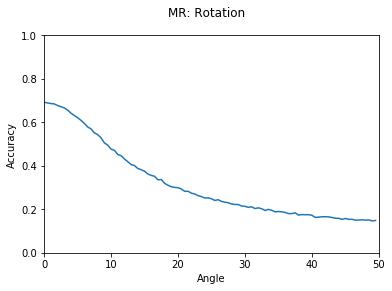

In [31]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

plt.axis([0, 50, 0, 1])
plt.plot(np.arange(0,50,0.5),accMat)
plt.xlabel("Angle")
plt.ylabel("Accuracy")
plt.suptitle("MR: Rotation")
plt.show()

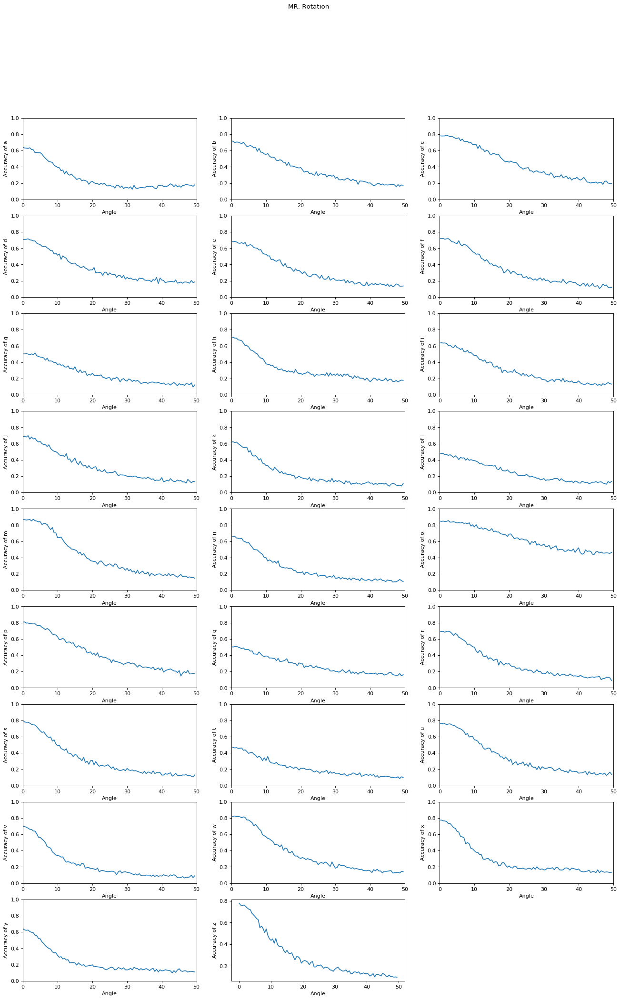

In [36]:
figure(num=None, figsize=(20, 30), dpi=80, facecolor='w', edgecolor='k')

zero = []
for j in range(num_classes):
    zero = []
    for i in range(len(aMatrix)):
        zero.append(aMatrix[i][j][j])
    plt.axis([0, 50, 0, 1])
    plt.subplot(9,3,j+1)
    plt.plot(np.arange(0,50,0.5),zero)
    plt.xlabel("Angle")
    plt.ylabel("Accuracy of %s" % chr(97+j))
plt.suptitle("MR: Rotation")
plt.show()

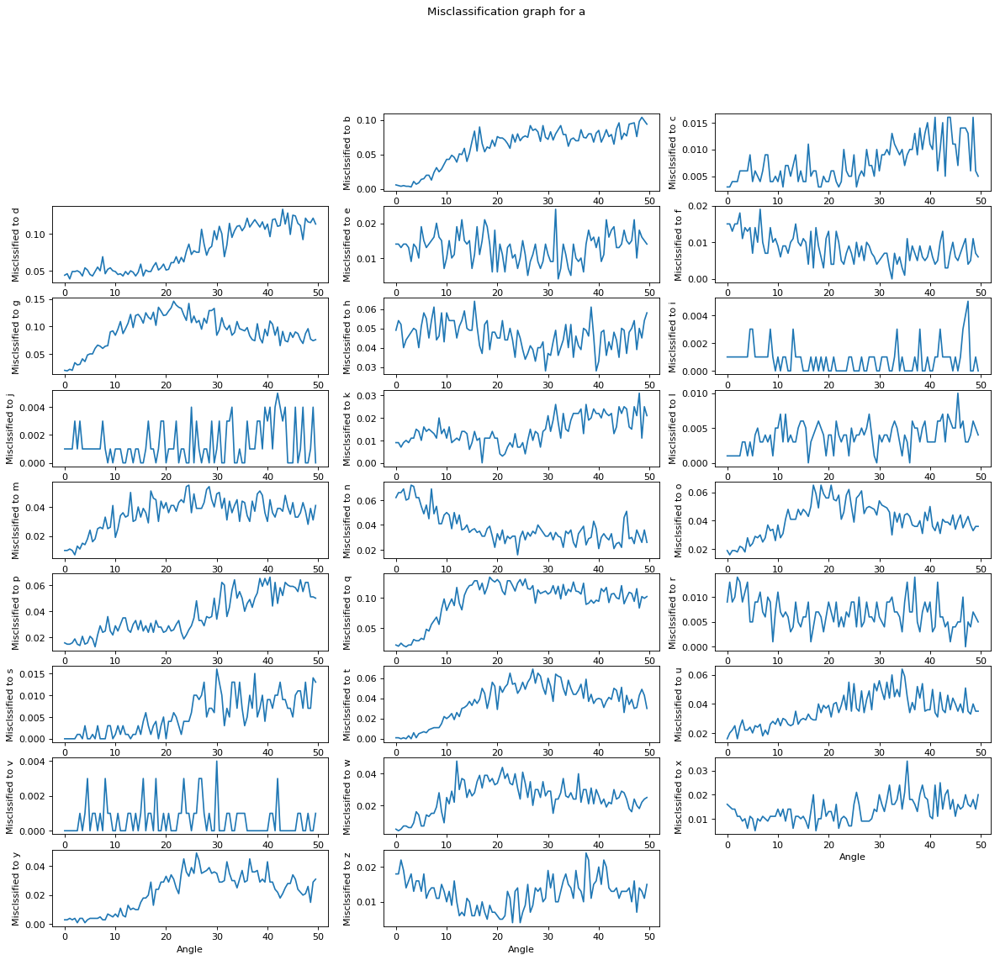

---------------------------------------------------------------------------------------------------------------------


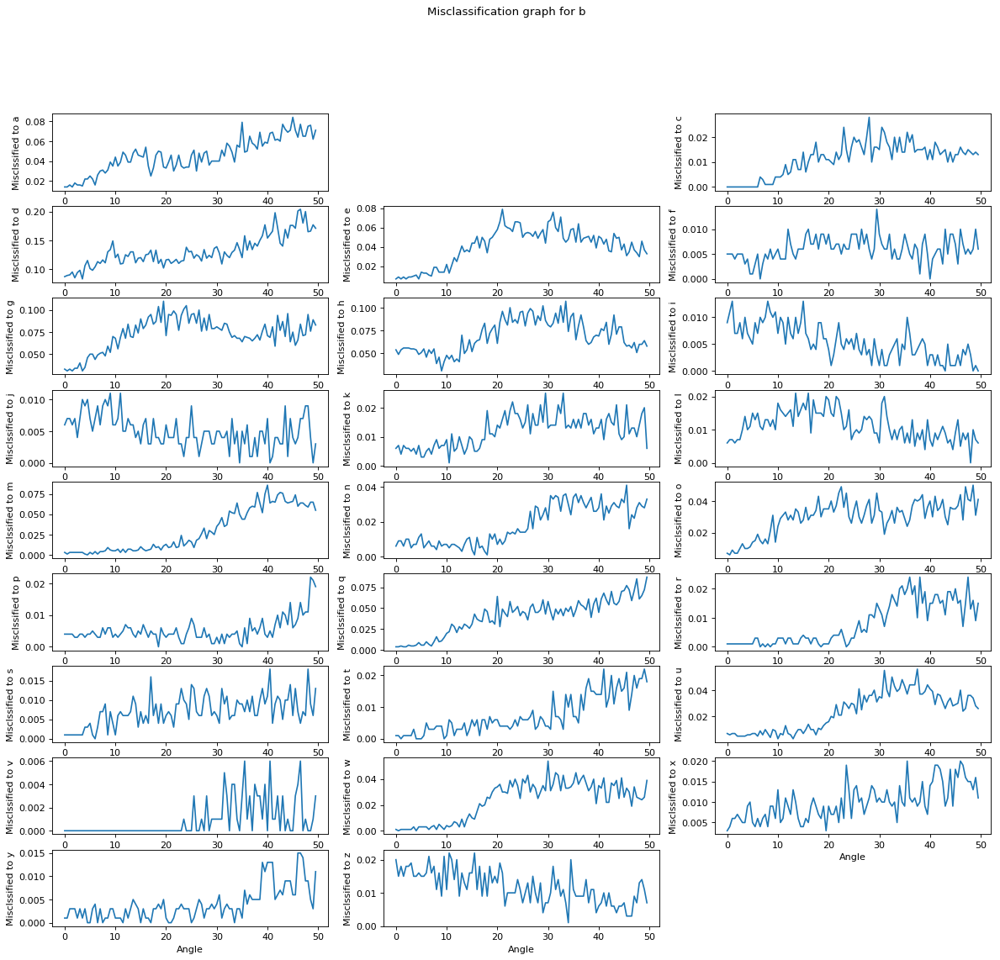

---------------------------------------------------------------------------------------------------------------------


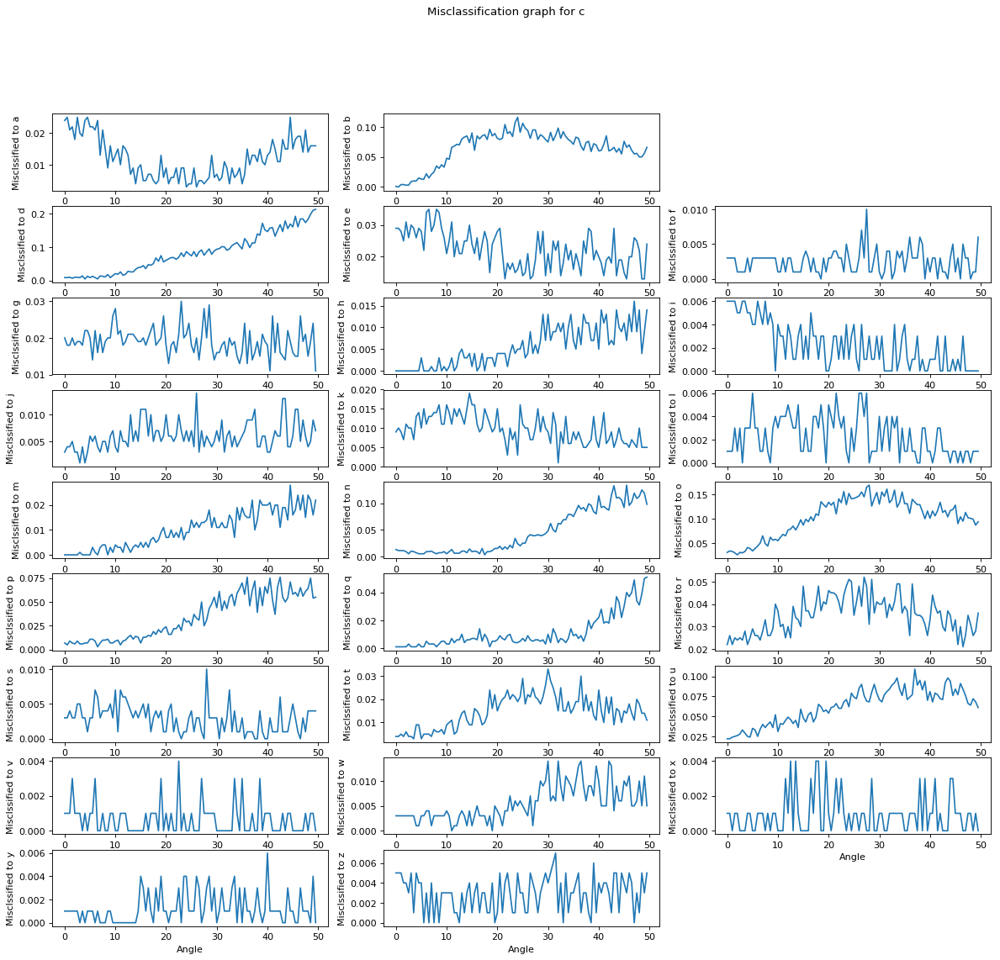

---------------------------------------------------------------------------------------------------------------------


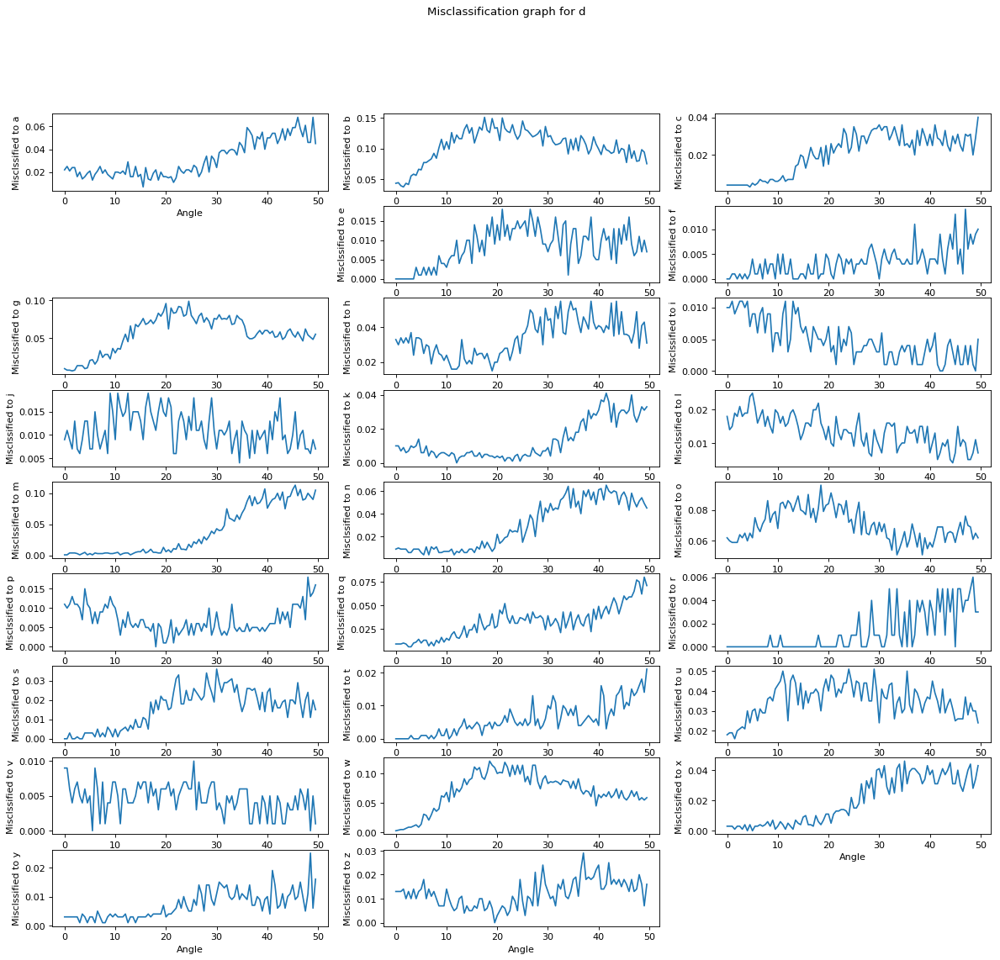

---------------------------------------------------------------------------------------------------------------------


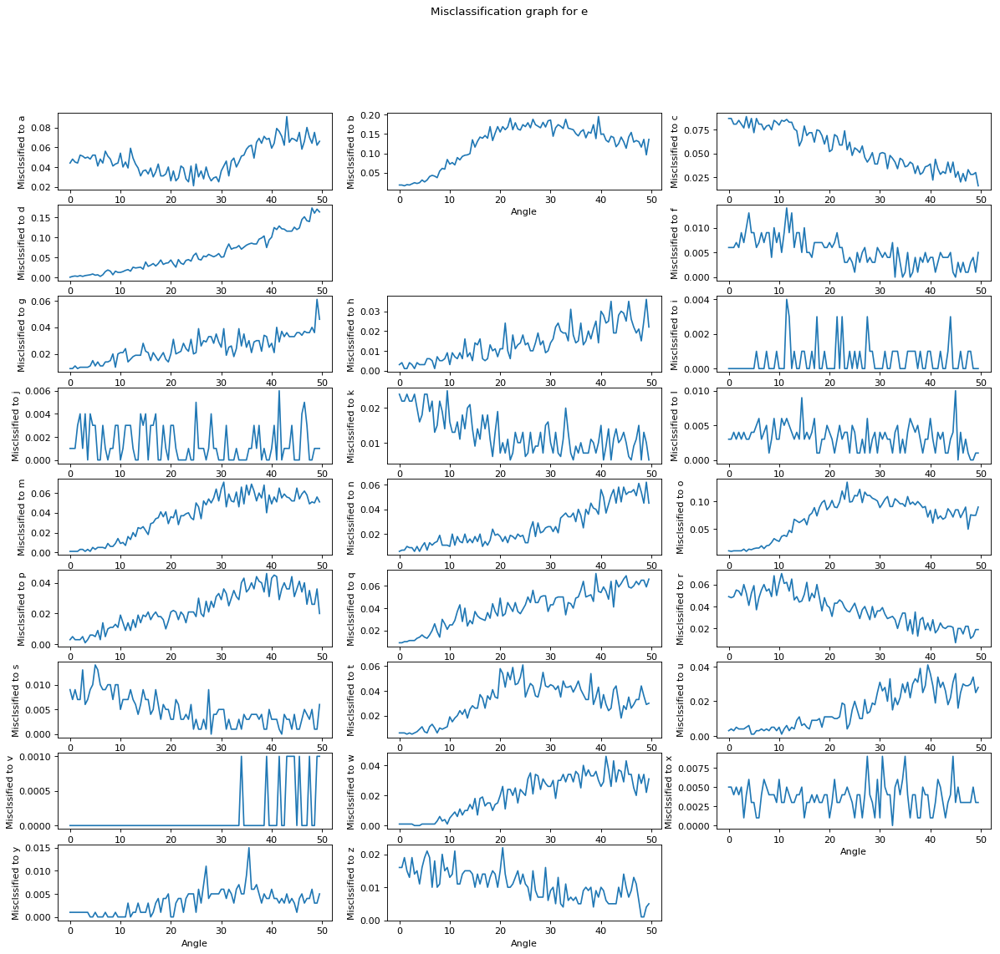

---------------------------------------------------------------------------------------------------------------------


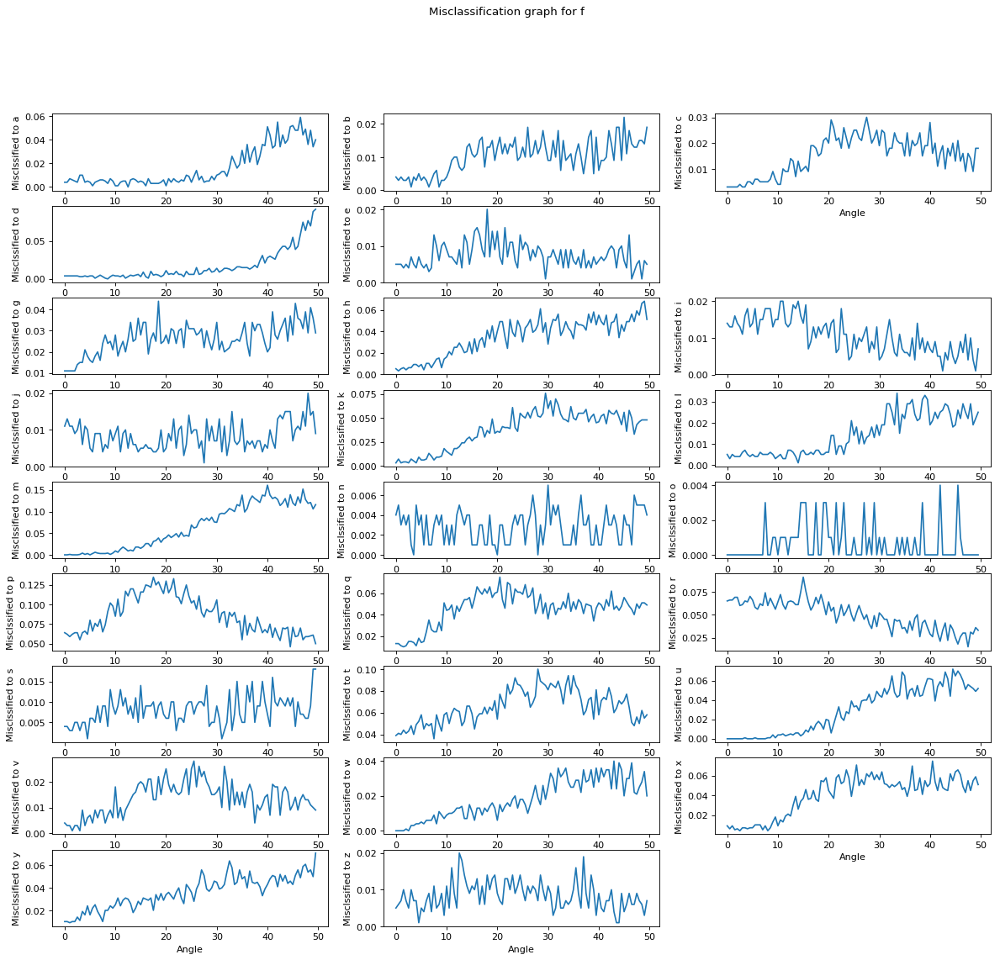

---------------------------------------------------------------------------------------------------------------------


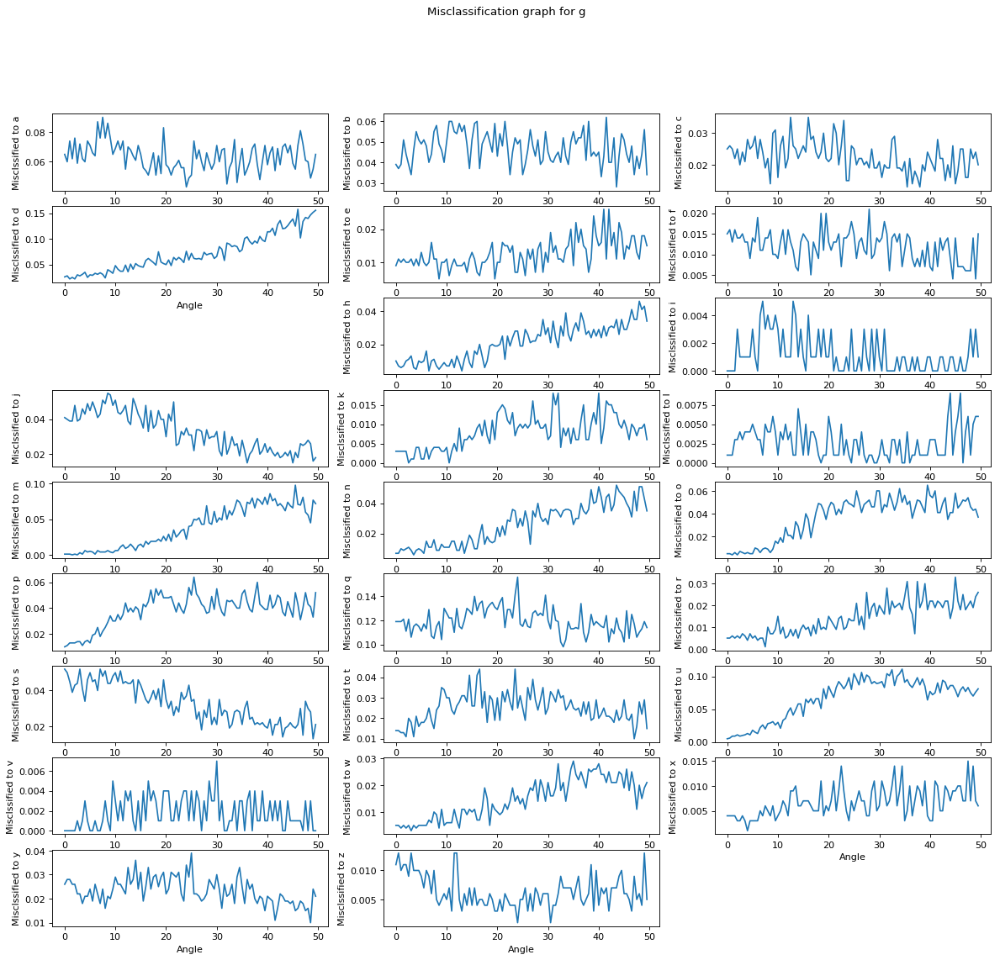

---------------------------------------------------------------------------------------------------------------------


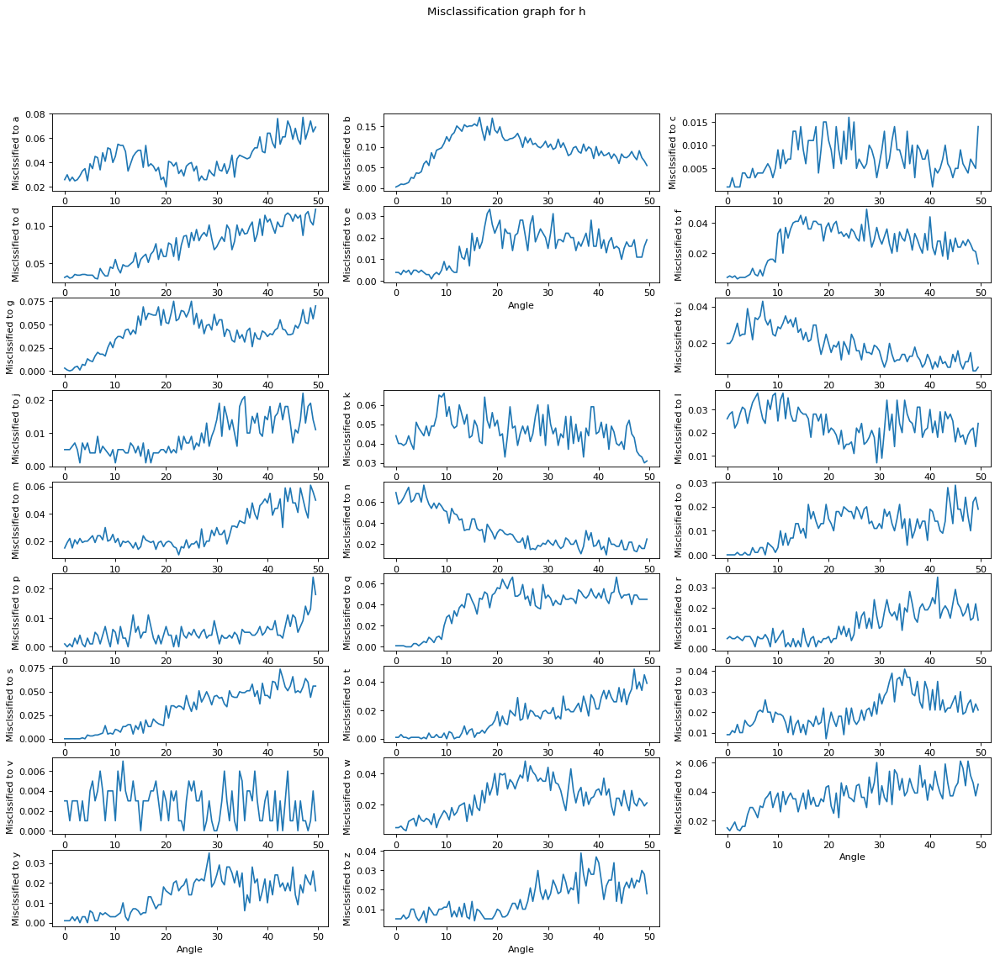

---------------------------------------------------------------------------------------------------------------------


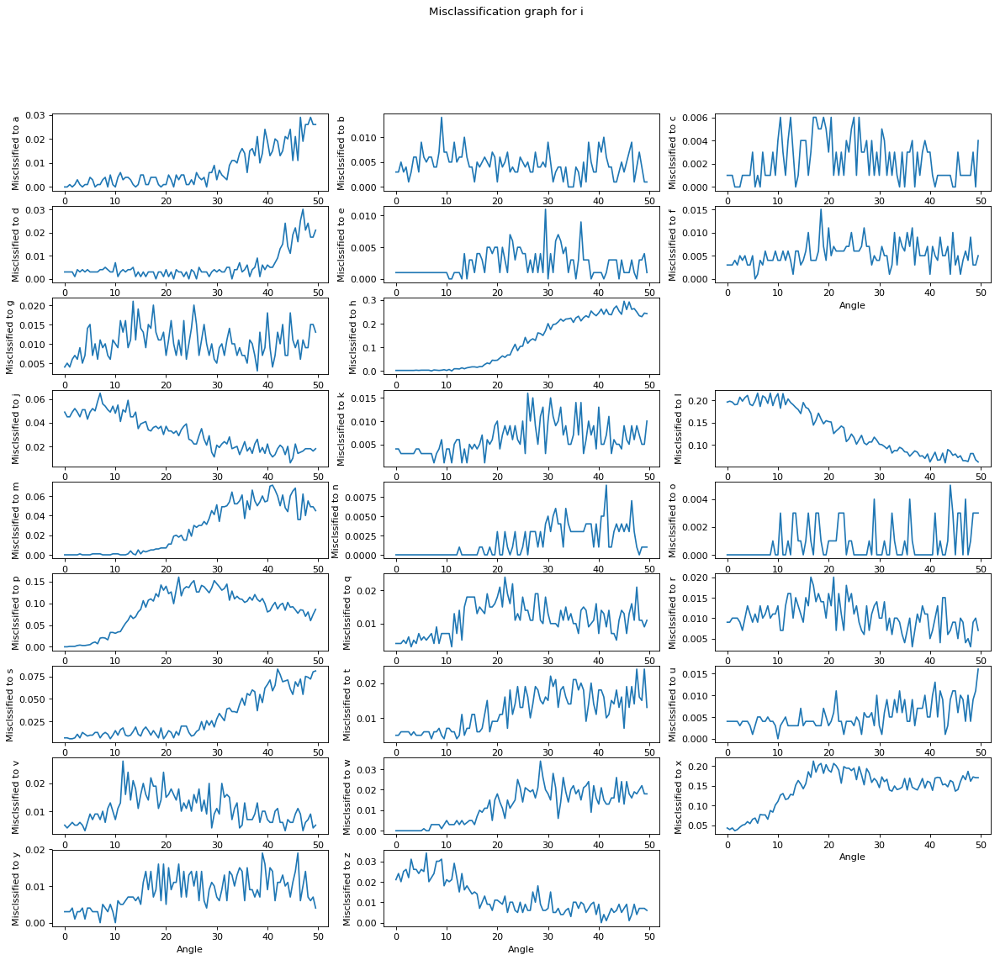

---------------------------------------------------------------------------------------------------------------------


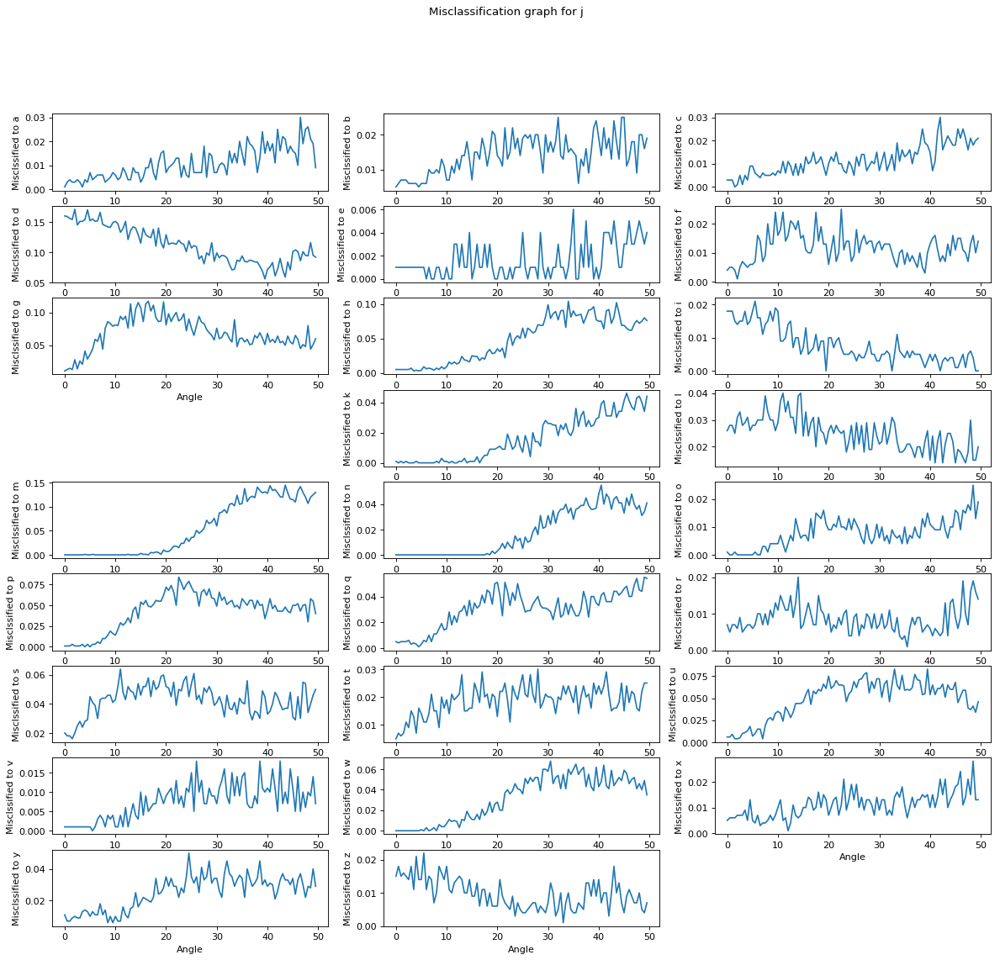

---------------------------------------------------------------------------------------------------------------------


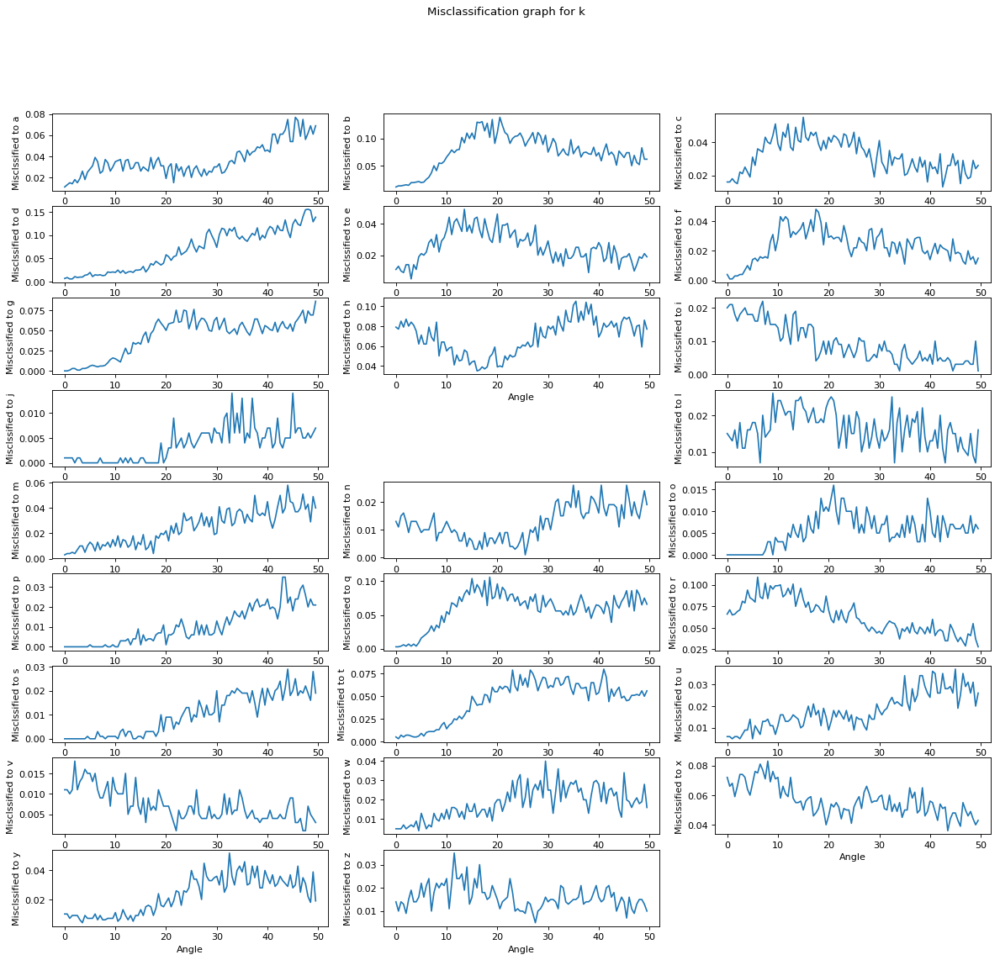

---------------------------------------------------------------------------------------------------------------------


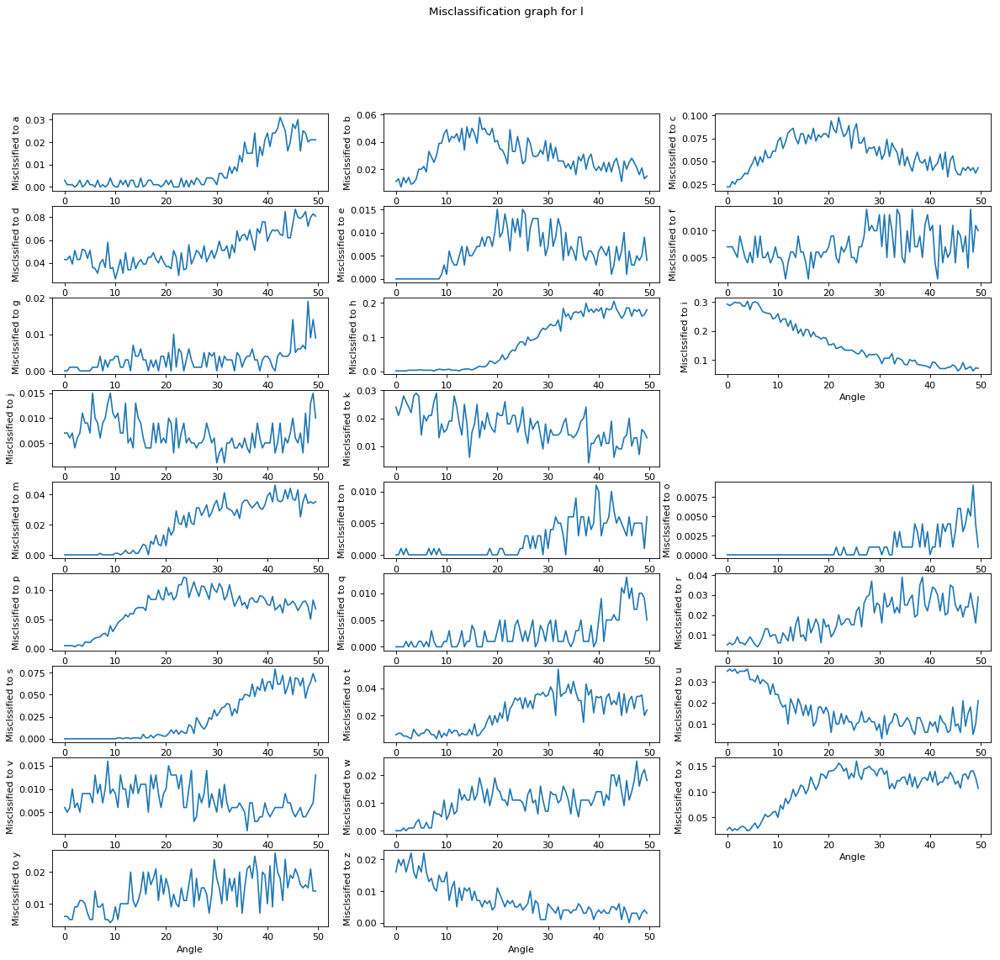

---------------------------------------------------------------------------------------------------------------------


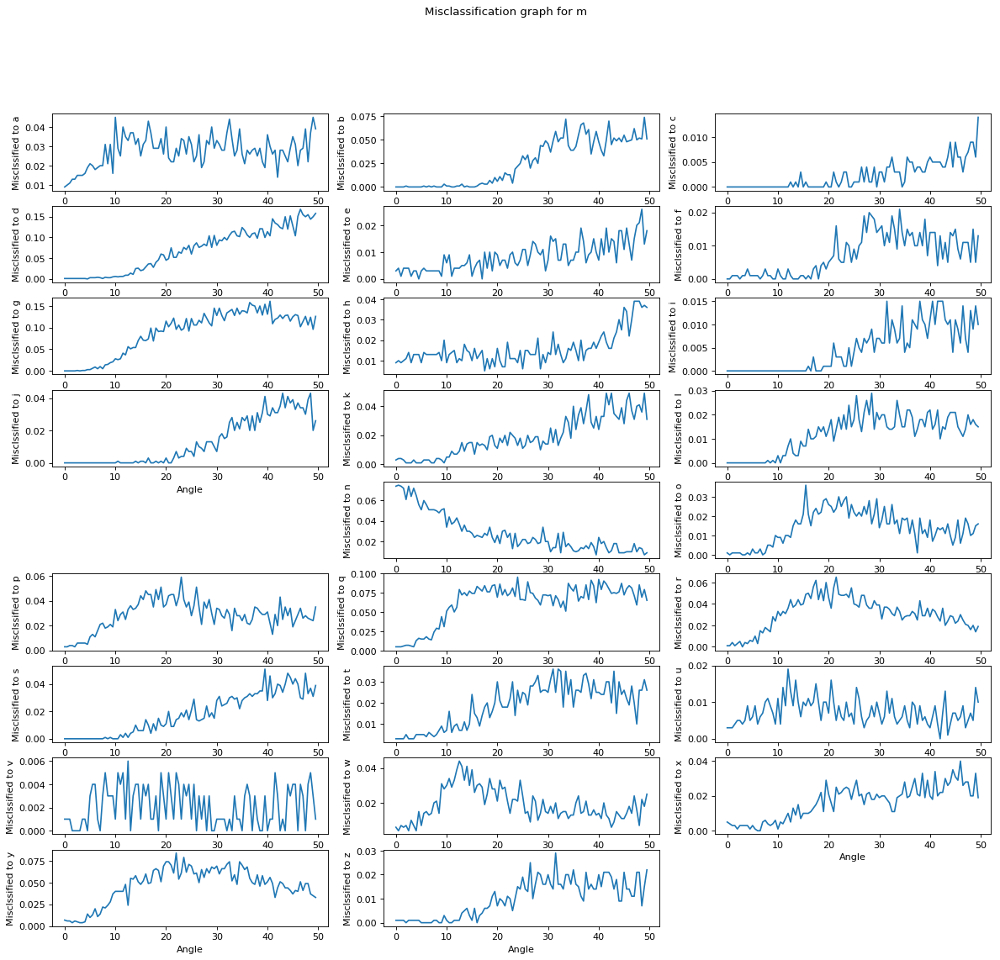

---------------------------------------------------------------------------------------------------------------------


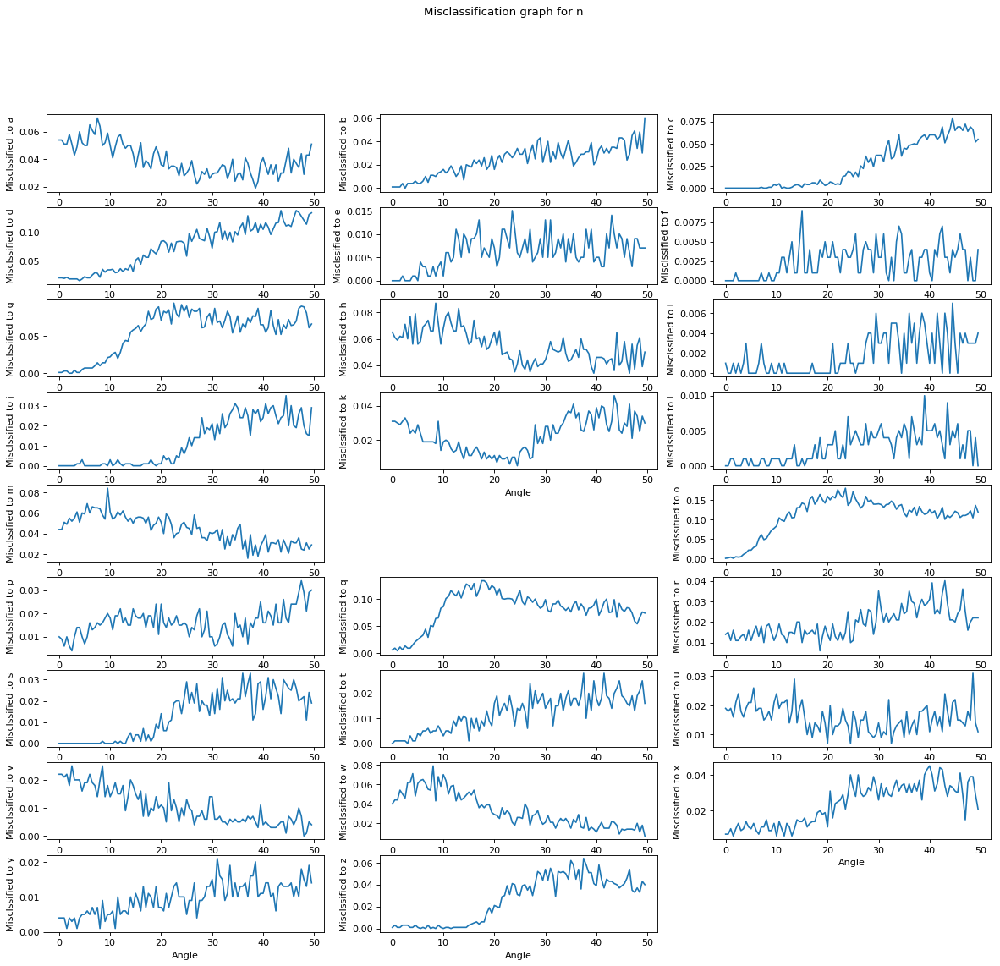

---------------------------------------------------------------------------------------------------------------------


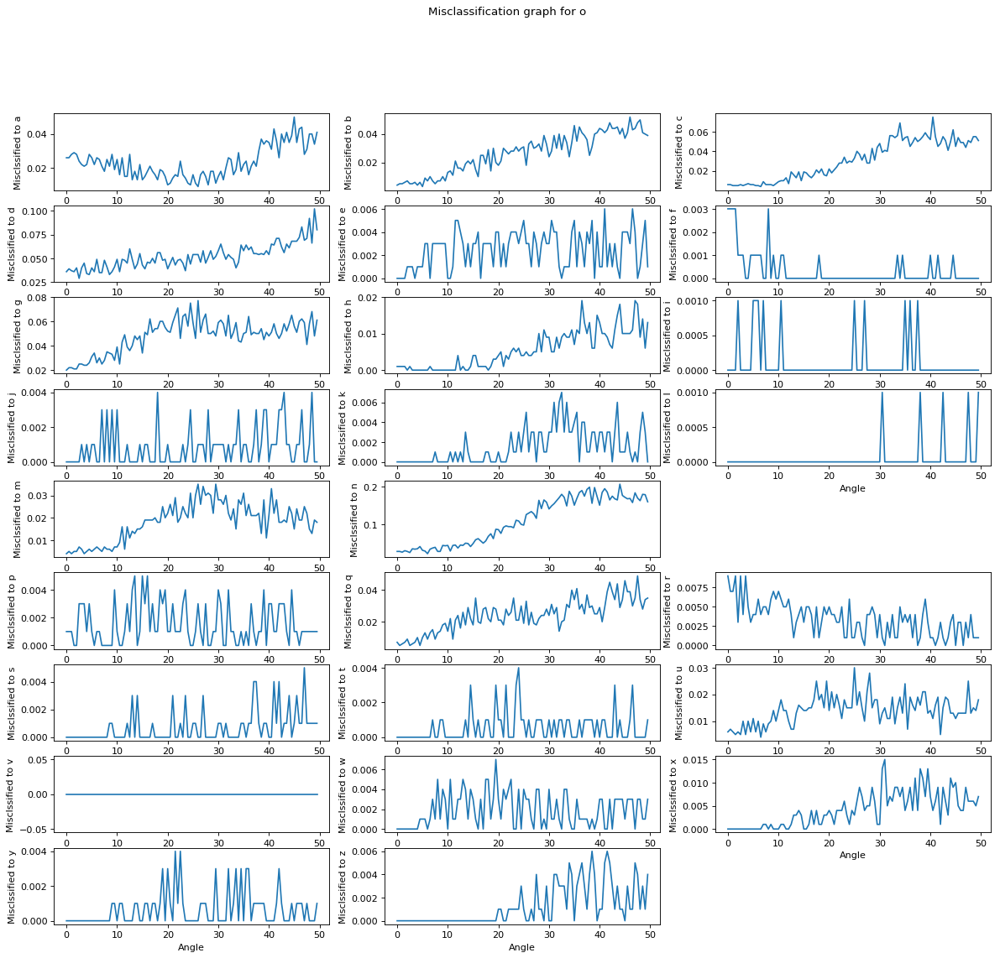

---------------------------------------------------------------------------------------------------------------------


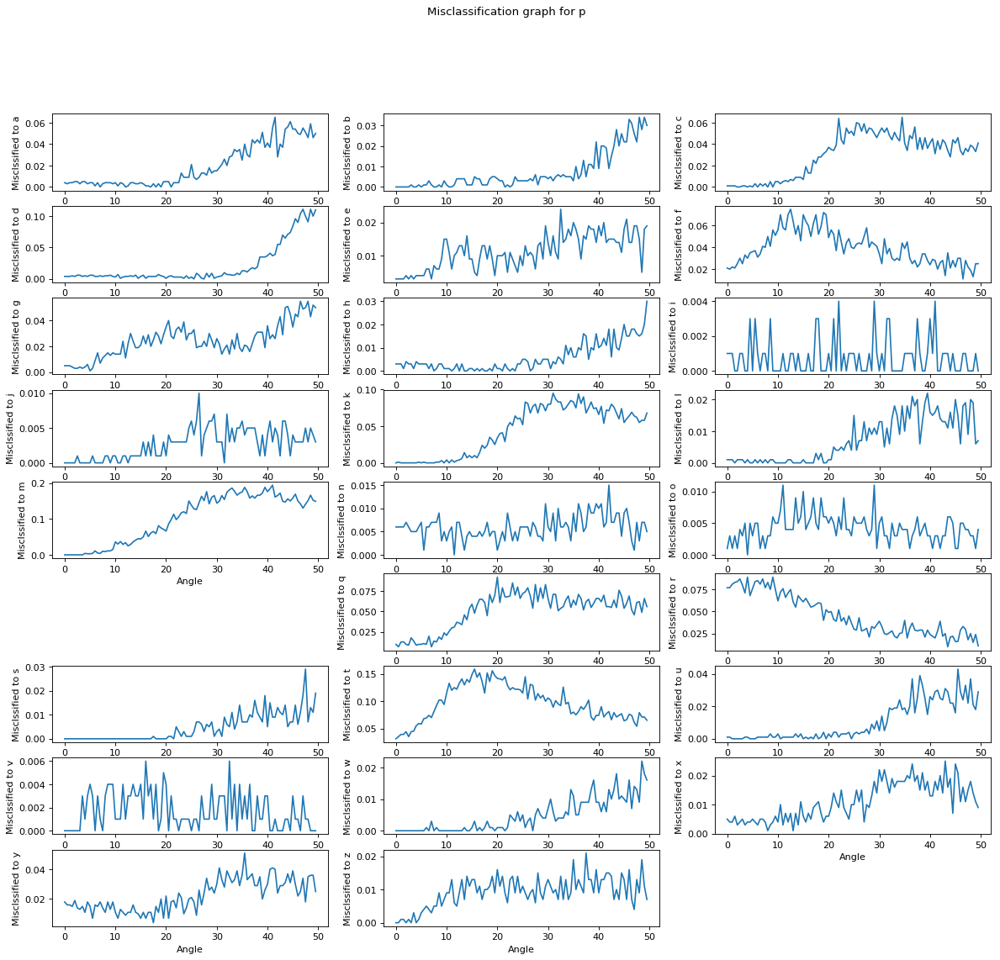

---------------------------------------------------------------------------------------------------------------------


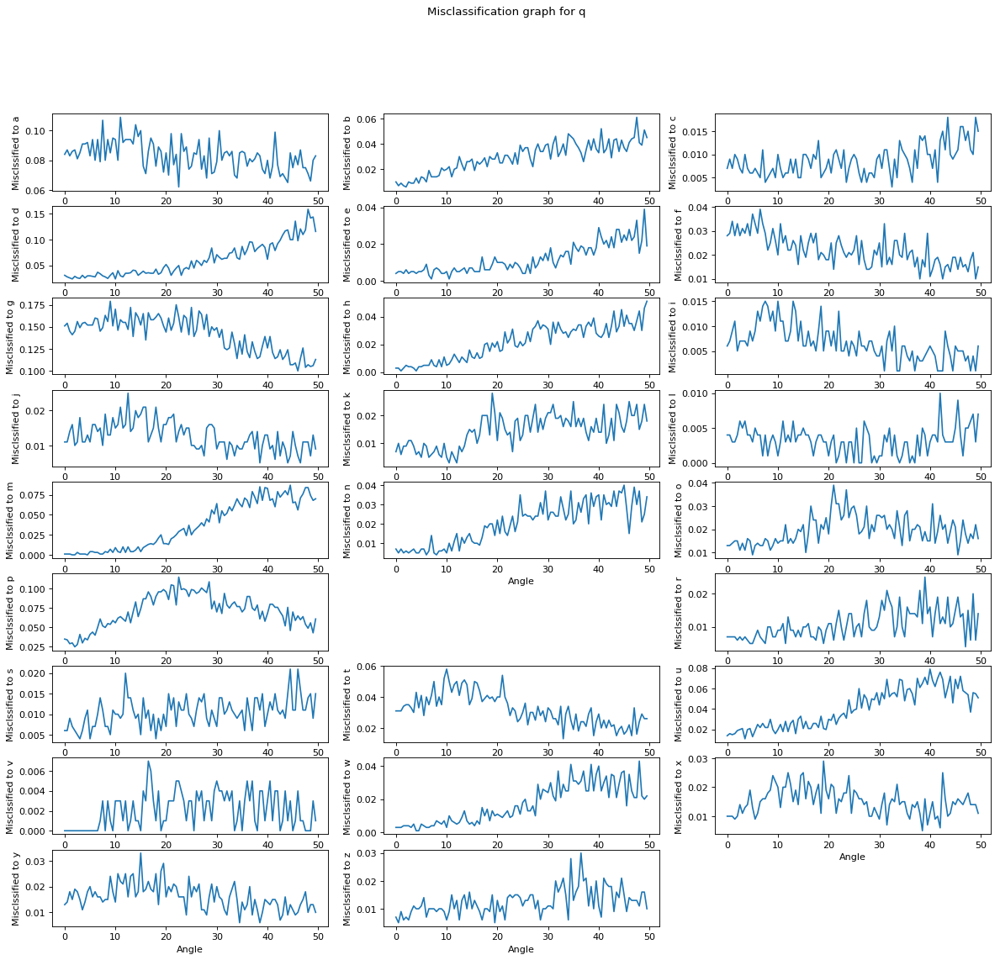

---------------------------------------------------------------------------------------------------------------------


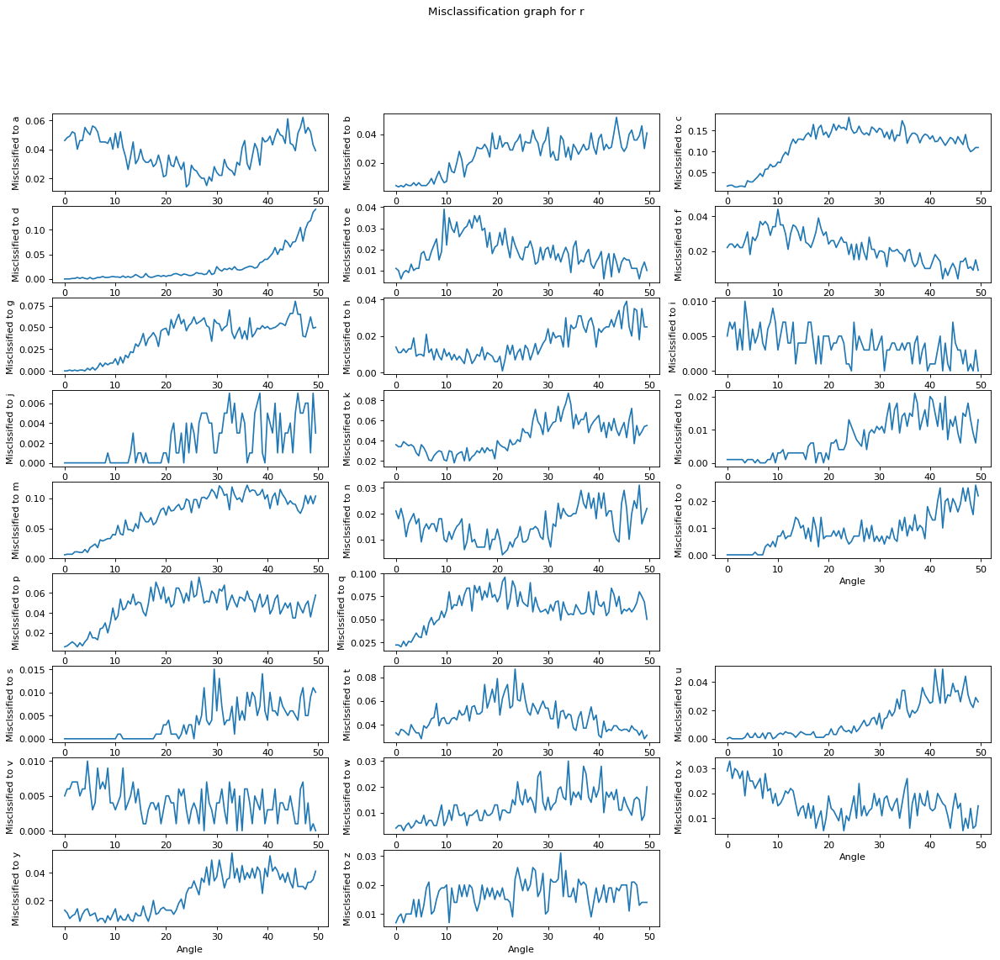

---------------------------------------------------------------------------------------------------------------------


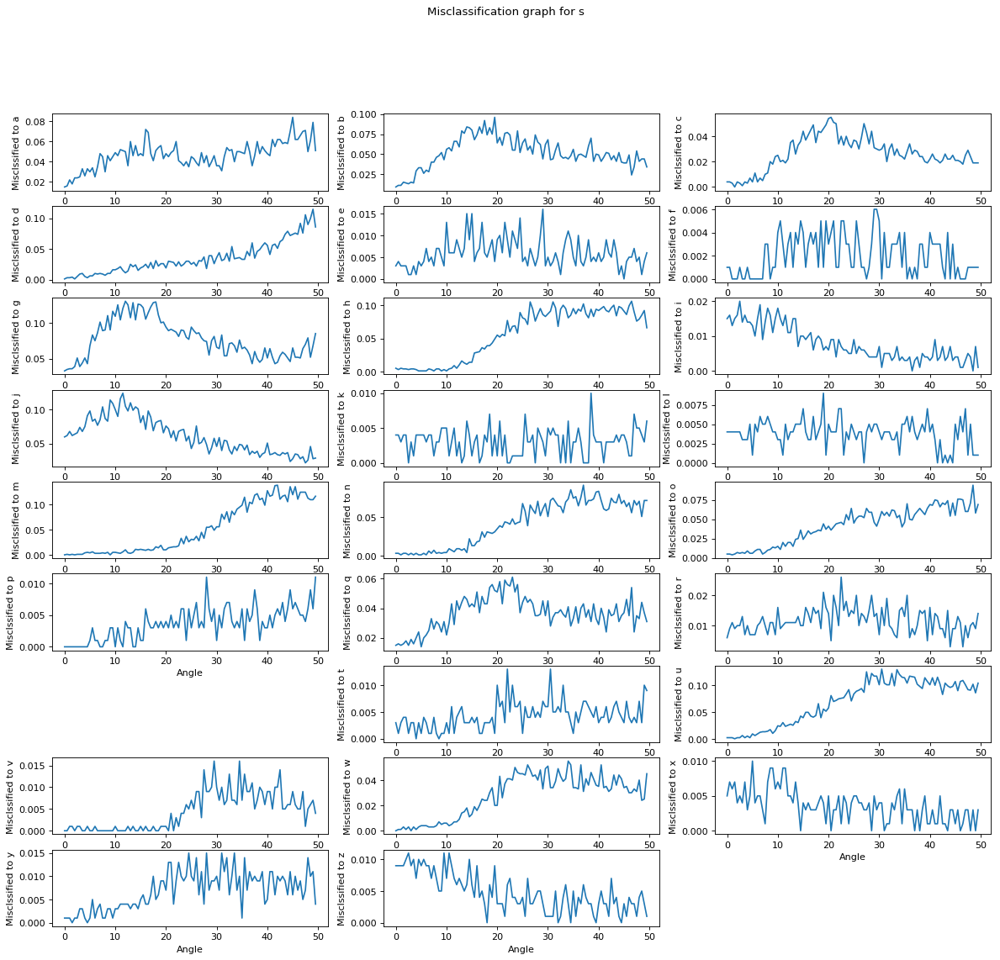

---------------------------------------------------------------------------------------------------------------------


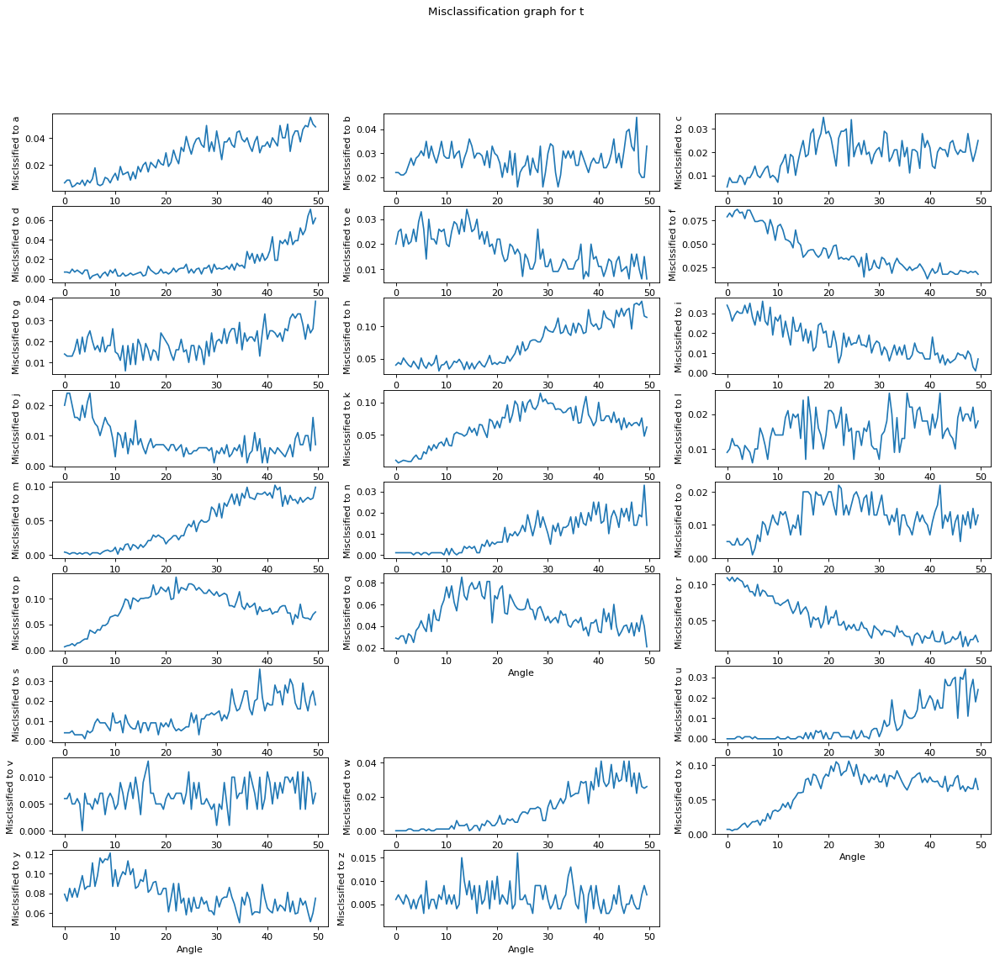

---------------------------------------------------------------------------------------------------------------------


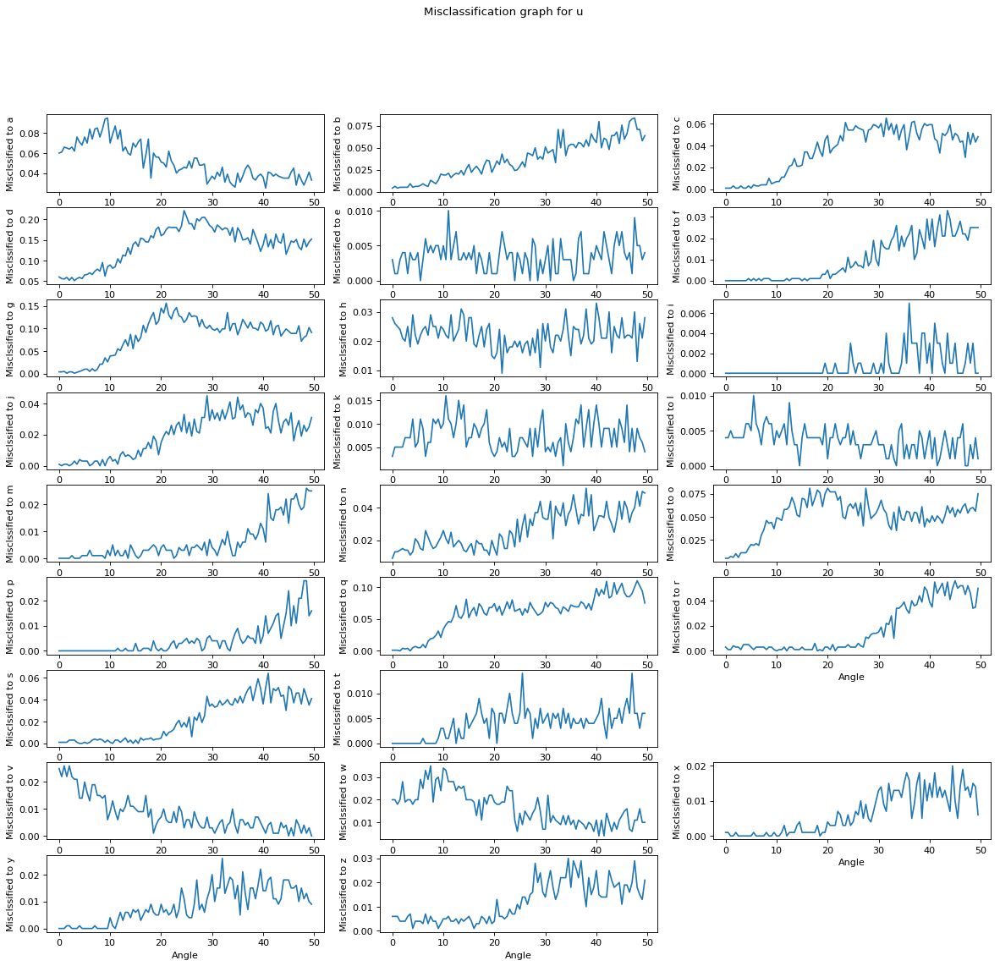

---------------------------------------------------------------------------------------------------------------------


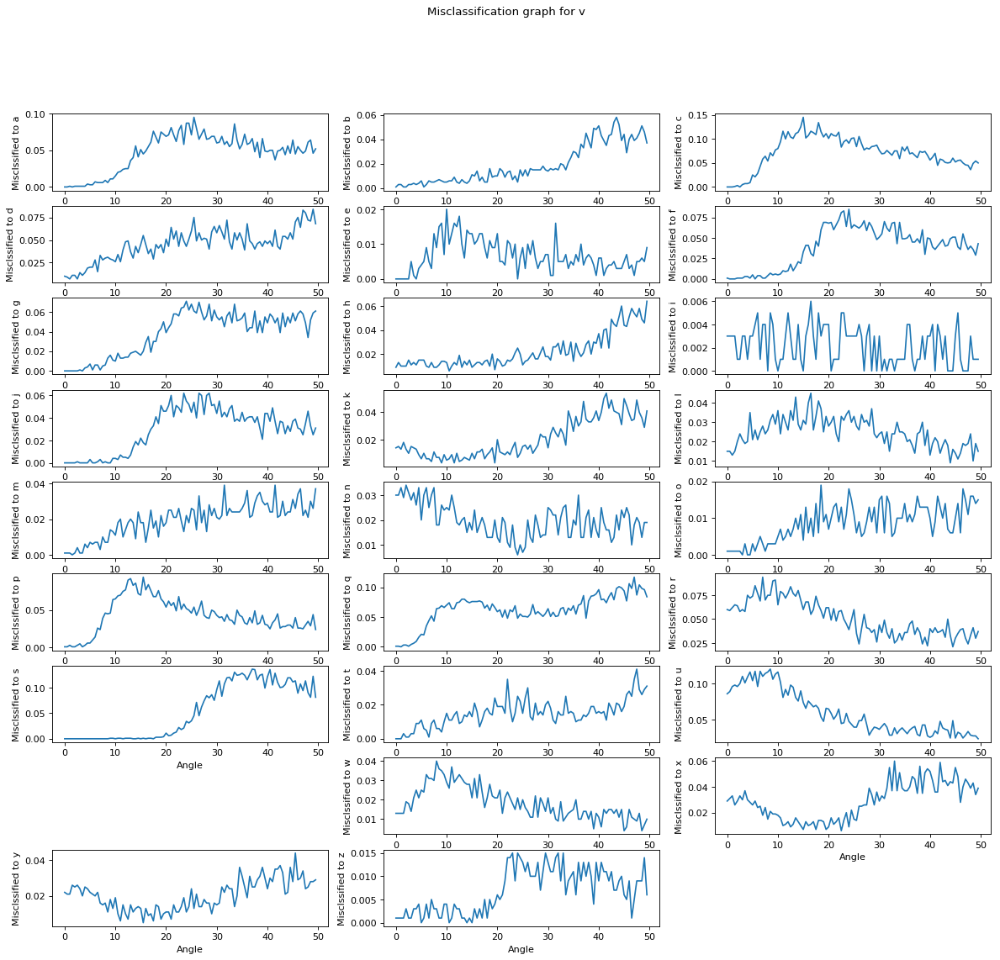

---------------------------------------------------------------------------------------------------------------------


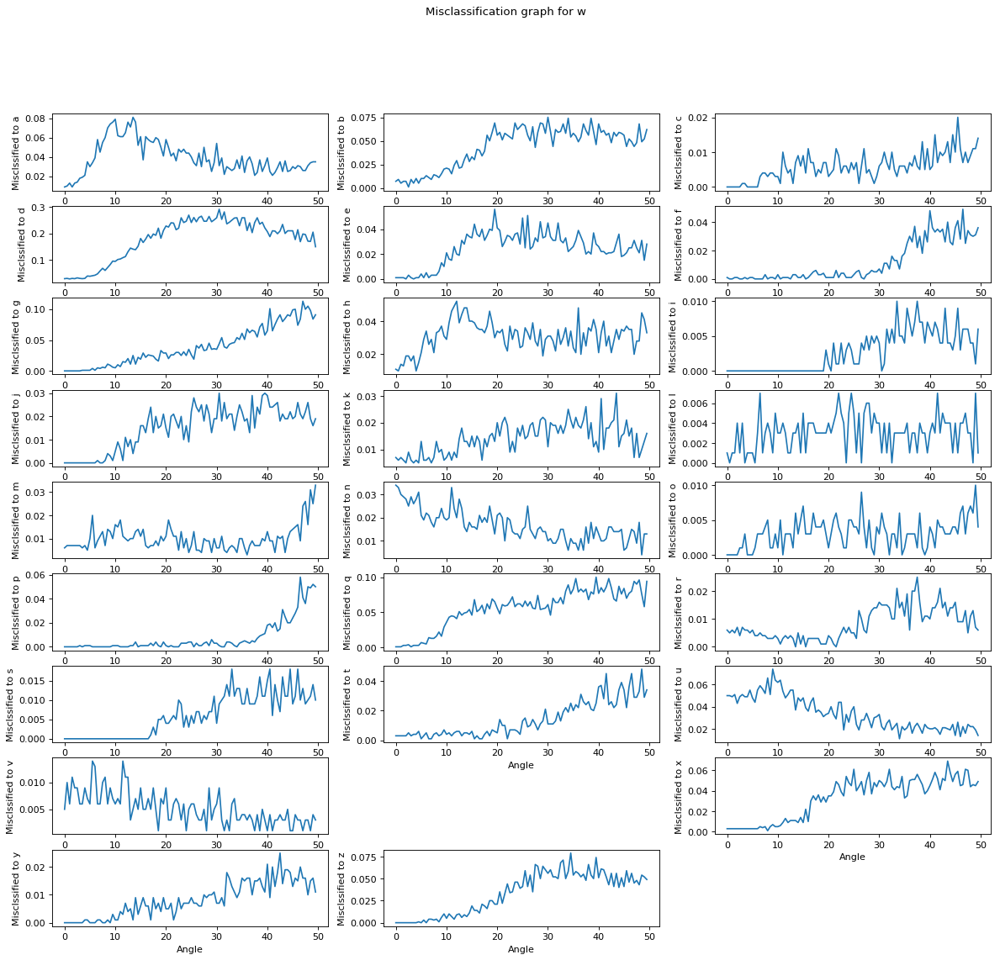

---------------------------------------------------------------------------------------------------------------------


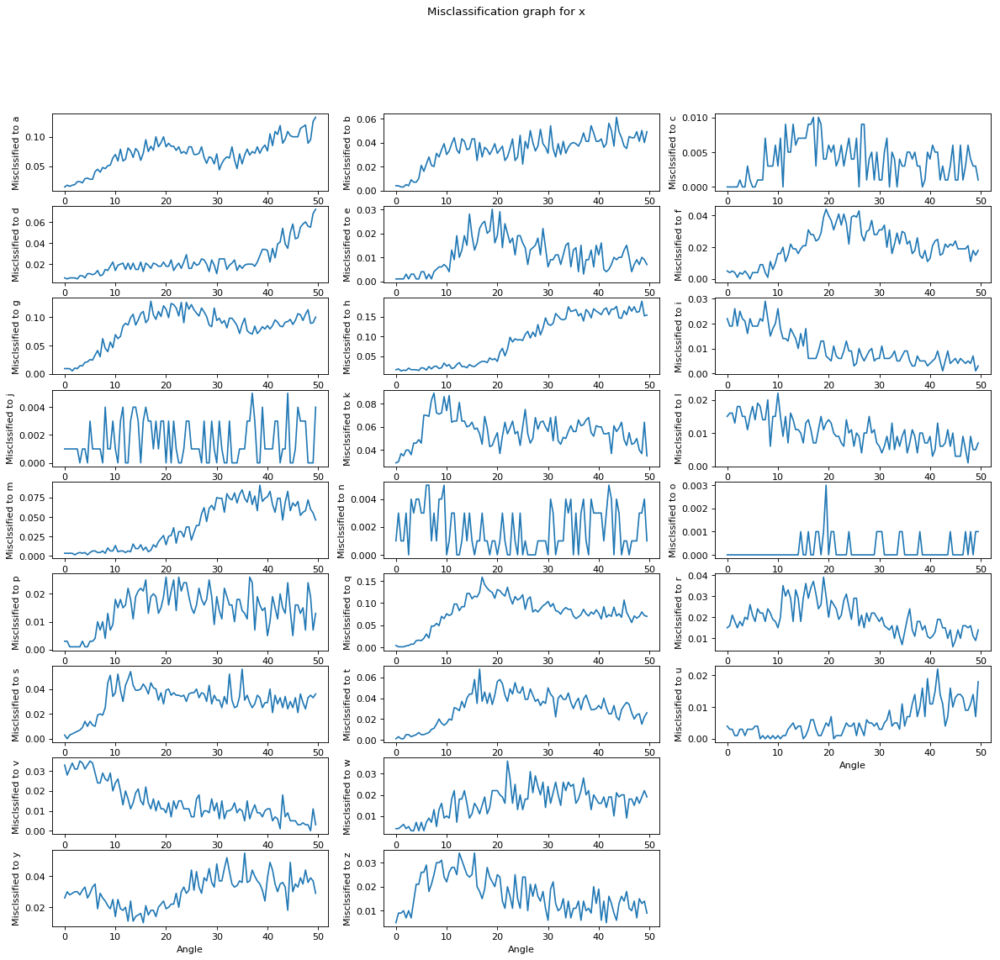

---------------------------------------------------------------------------------------------------------------------


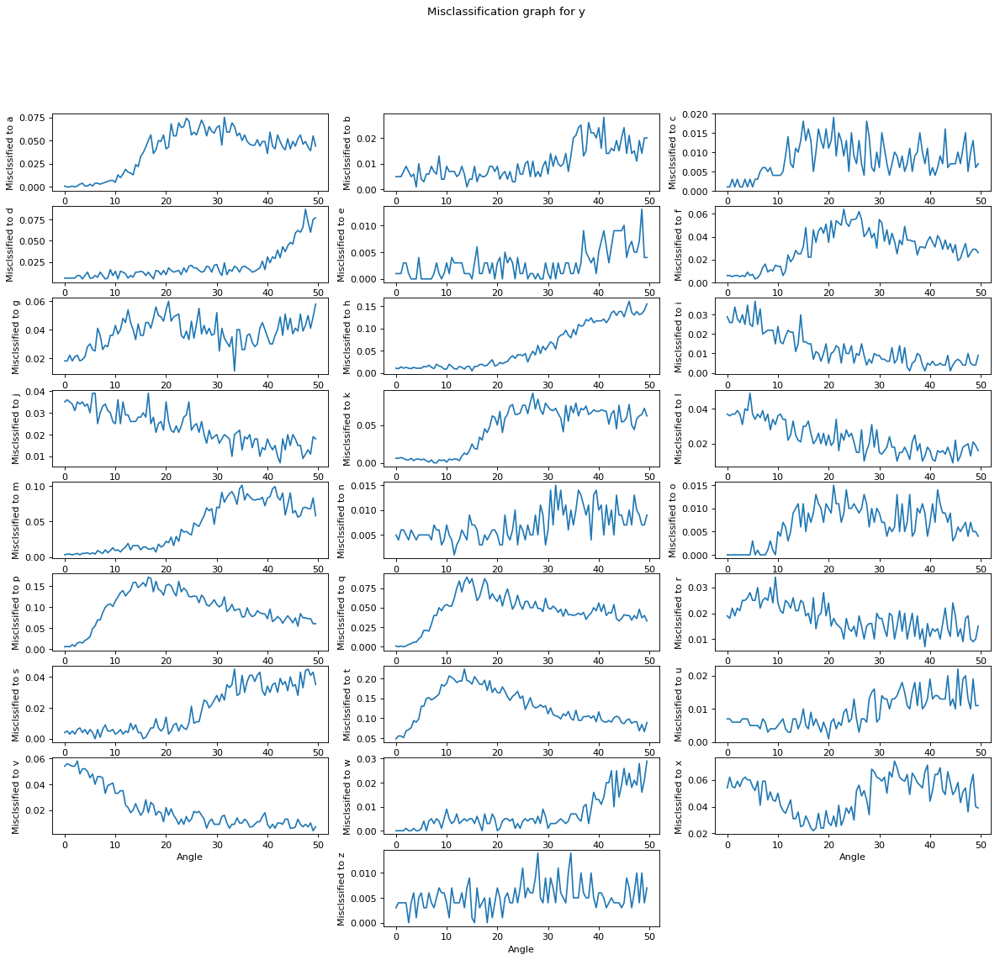

---------------------------------------------------------------------------------------------------------------------


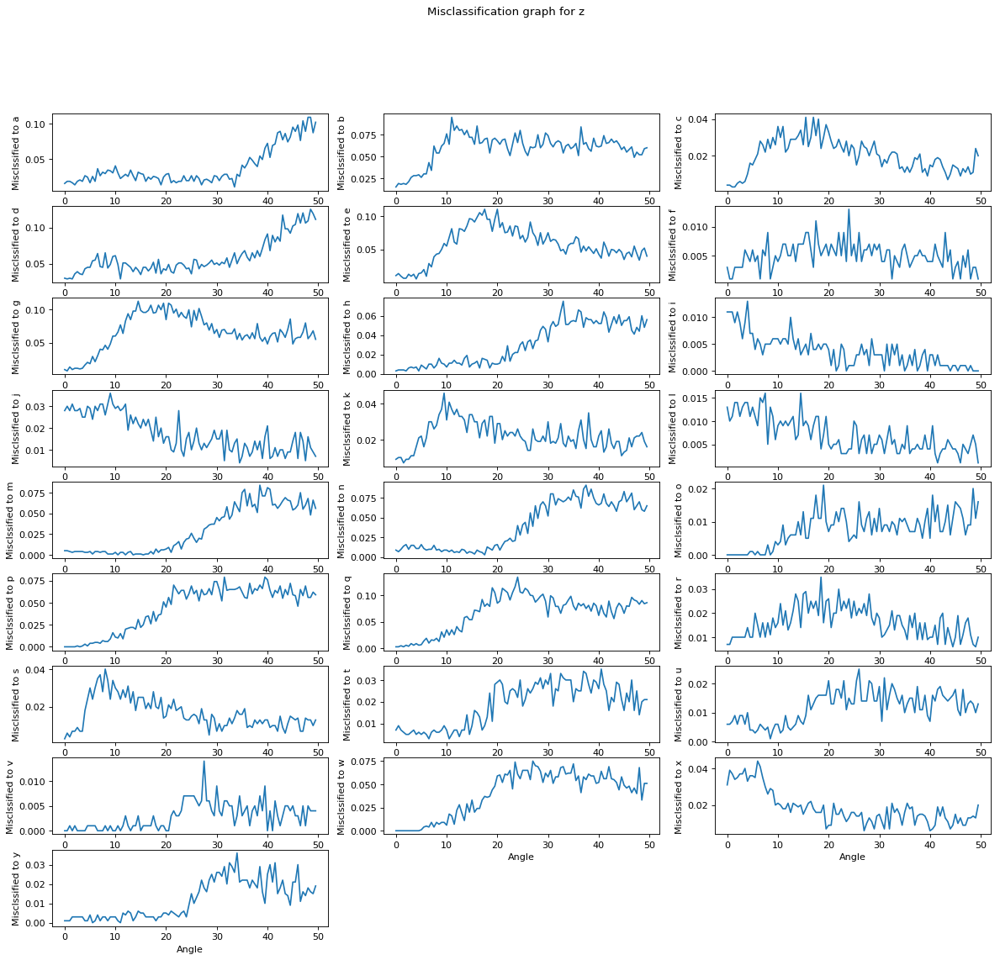

---------------------------------------------------------------------------------------------------------------------


In [37]:
zero = []

for j in range(num_classes):
    figure(num=None, figsize=(18, 16), dpi=80, facecolor='w', edgecolor='k')
    for k in range(0,num_classes):
        zero = []
        if j != k: 
            for i in range(len(aMatrix)):
                zero.append(aMatrix[i][j][k])
        else:
            continue      
        plt.subplot(9,3,k+1)
        plt.plot(np.arange(0,50,0.5),zero)
        plt.xlabel("Angle")
        plt.ylabel("Misclssified to %s" %chr(97+k))
    plt.suptitle("Misclassification graph for %s" %(chr(97+j)))
    plt.show()
    print("---------------------------------------------------------------------------------------------------------------------")

In [17]:
print(len(mnist.test.labels))

20800
